<a href="https://colab.research.google.com/github/NeznaikanaLune/MISIS_DS_Masters_degree_2020/blob/master/ml_8_time_series.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Анализ временных рядов


**Временной ряд** — последовательность измерений, упорядоченных по времени.

При анализе временных рядов учитывается взаимосвязь измерений со временем, в отличие от анализа простых выборок данных, где привязка наблюдений ко времени не важна.

**Примеры:**

Характеристики технических систем: температура, давление, напряжение, сила тока;
Показатели природных систем: погода, запасы природных ископаемых;
Показатели социальных систем: население стран, занятость населения;
Показатели экономических систем: курсы валют и другие.

**Временные ряды делятся на три типа:**

- Непрерывные данные: детектор тепла непрерывно записывает измеренную температуру.
- Дискретные данные: целевая температура изменяется периодически, например, в какой-то момент времени выставили конкретную температуру. 
- События: разовое событие, либо оно произошло, либо нет. Например, открытие окна.

**Области анализа временных рядов**

- Прогнозирование (товарооборот, количество авиаперелётов, цены на акции);
- Нахождение аномалий (нагрузка на мобильную сеть оператора, ЭКГ, мониторинг технологических процессов);
- Декодирование сигнала (распознавание речи, нейроинтерфейсы, определение скрытых параметров системы по сигналам с датчиков).

## Предобработка данных

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt

In [ ]:


url = 'https://drive.google.com/file/d/1Dpjv0sUg_Oge8s13UAtddT5BOL3q2Tmm/view?usp=sharing'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
df = pd.read_csv(path)
print(df.shape)
print(f'df.ts.min() = {df.ts.min()}')
print(f'df.ts.max() = {df.ts.max()}')
print('home',df.home.nunique(),df.home.unique())
print('serialNo',df.serialNo.nunique())
df.head()

(4824, 6)
df.ts.min() = 2018-10-01
df.ts.max() = 2019-04-30
home 8 [165132 174376  29473 234419 193000 213528 251841 300551]
serialNo 25


,ts,serialNo,home,batteryVoltageMilliV,insideTemperatureCentiC,humidityMilliPerc
0,2018-10-01,VA4202760704,165132,2787.1310,1953.0737,575.49180
1,2018-10-02,VA4202760704,165132,2786.1047,1901.0000,550.63710
2,2018-10-03,VA4202760704,165132,2784.6934,1878.0369,550.09204
3,2018-10-04,VA4202760704,165132,2773.3500,1976.9114,583.65820
4,2018-10-05,VA4202760704,165132,2776.4314,2041.4010,589.74110


In [ ]:
# df = pd.read_csv('srt_data.csv')
# df.head()

In [ ]:
df.isna().sum()

ts                         0
serialNo                   0
home                       0
batteryVoltageMilliV       3
insideTemperatureCentiC    2
humidityMilliPerc          0
dtype: int64

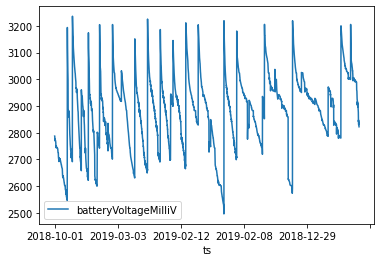

In [ ]:
df.plot('ts', 'batteryVoltageMilliV')

In [ ]:
df[df.batteryVoltageMilliV.isna()].head()

,ts,serialNo,home,batteryVoltageMilliV,insideTemperatureCentiC,humidityMilliPerc
10,2018-10-11,VA4202760704,165132,NaN,2135.1000,657.02356
11,2018-10-12,VA4202760704,165132,NaN,2138.1677,676.12256
12,2018-10-13,VA4202760704,165132,NaN,2080.6738,653.83685


In [ ]:
df[df.insideTemperatureCentiC.isna()].head()

,ts,serialNo,home,batteryVoltageMilliV,insideTemperatureCentiC,humidityMilliPerc
23,2018-10-24,VA4202760704,165132,2750.4220,NaN,605.1256
24,2018-10-25,VA4202760704,165132,2750.6438,NaN,617.4750


In [ ]:
# Выберите данные с датчика с серийным номером VA2170620672.
# Укажите максимальное значение напряжения на батарее (batteryVoltageMilliV)
df.loc[df.serialNo=='VA2170620672','batteryVoltageMilliV'].max()

3219.567

In [ ]:
# Для того же датчика укажите значение напряжения на батарее, соответствующее % квантиля распределения.
df.loc[df.serialNo=='VA2170620672','batteryVoltageMilliV'].quantile(0.75)

2951.2801

In [ ]:
#Для того же датчика выберите данные за ноябрь 2018 г. и укажите медианное значение на влажности (humidityMilliPerc).
df.ts = pd.to_datetime(df.ts)
df.loc[(df.serialNo=='VA2170620672')&(df.ts>='2018-11-01')&(df.ts<='2018-11-30'),'humidityMilliPerc'].median()

566.3562

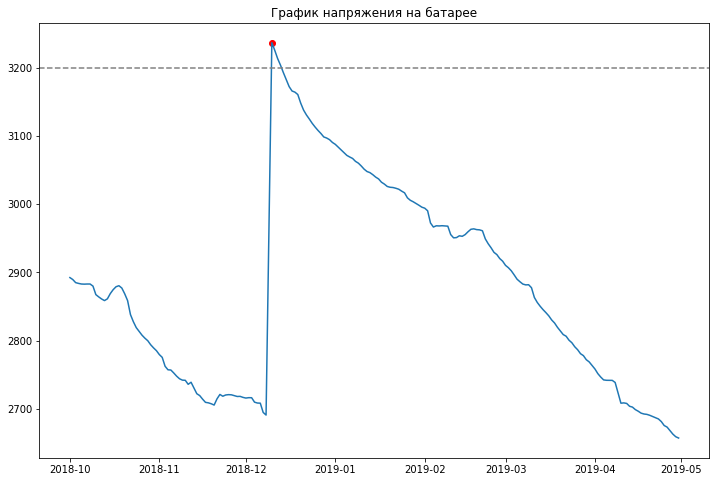

In [ ]:
# Выберите данные с датчика с серийным номером VA2048854528.
# Постройте график напряжения на батарее (batteryVoltageMilliV).
# Укажите, сколько раз батарея была заменена (количество пиков со значением выше 3200 mV).

slice_1 = df.loc[df.serialNo=='VA2048854528']
f, ax = plt.subplots(figsize=(12,8))
ax.plot(slice_1.ts, slice_1.batteryVoltageMilliV)
# ax.grid()
ax.axhline(y=3200,ls='--',c='grey')
ax.scatter(slice_1[slice_1['batteryVoltageMilliV']==slice_1['batteryVoltageMilliV'].max()].ts,slice_1['batteryVoltageMilliV'].max(),c='r')
plt.title('График напряжения на батарее')
plt.show()

In [ ]:
# Укажите, сколько значений температуры (среди всех данных) лежат строго ниже  1200сС (12 градусов Цельсия).

print('Кол-во значений температуры (среди всех данных) лежат строго ниже  1200сС:',df[df.insideTemperatureCentiC<1200].shape[0])

Кол-во значений температуры (среди всех данных) лежат строго ниже  1200сС: 92


In [ ]:
#Укажите, сколько значений температуры (среди всех данных) лежат нестрого выше 75%-квантиля, вычисленного по всем датчикам.
quant_75 = df['insideTemperatureCentiC'].quantile(0.75)
print('Кол-во значений температуры (среди всех данных) лежат нестрого выше {}сС:{}'.format(round(quant_75,3),df[df.insideTemperatureCentiC>=quant_75].shape[0]))

Кол-во значений температуры (среди всех данных) лежат нестрого выше 2147.197сС:1206


## Интерполяция

**Интерполяция** — способ нахождения промежуточных значений величины по имеющемуся дискретному набору известных значений.


Основные способы интерполяции:

- Метод ближайшего соседа
- Интерполяция многочленами:
- Линейная интерполяция
- Интерполяция сплайнами


For example, if you want to make the color of "text" green, just type:

<font color='green'>**В pandas реализуются методом interpolate() с различными параметрами.**</font>

<font color='purple'>**Метод ближайшего соседа**</font>

В интерполяции методом ближайшего соседа (nearest) значение ближайшей известной точки распространяется на соседние неизвестные точки:

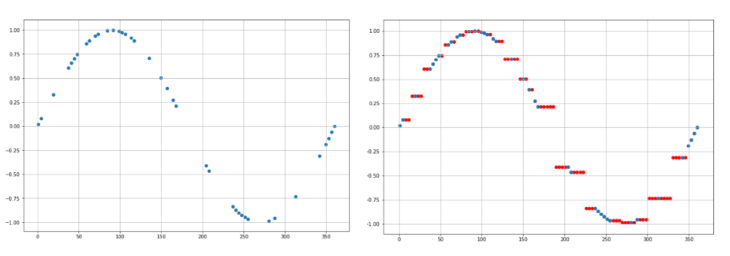

<font color='purple'>Частный случай — метод заполнения вперёд (forward fill)</font>, где значение предыдущей известной точки распространяется на все последующие неизвестные точки. Часто используется для интерполяции дискретных данных, где значение изменяется скачком.

<font color='purple'>**Линейная интерполяция**</font>

Наиболее частый метод интерполяции — интерполяция линейной функцией P(x)=ax+b. 

Соседние известные точки соединяются прямой линией.  Значения неизвестных точек определяются, как значения точек, лежащих на этой прямой. 

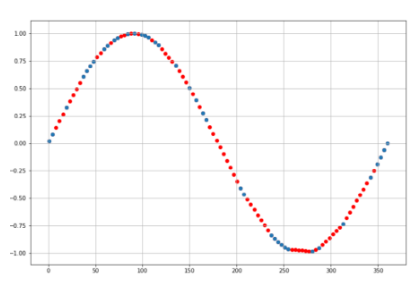

<font color='blue'>**Когда необходимо приведение к регулярной сетке?**</font>

- Данные получены в произвольные промежутки времени. Гораздо удобнее работать с данными на регулярной сетке. 
- Нужно совместить два временных ряда на регулярных сетках, но эти сетки не совпадают. В этом случае оба ряда приводятся к общей сетке.

Для приведения данных к регулярной сетке используются методы интерполяции: 

- Задать желаемую сетку;
- Интерполировать значения временных рядов в этих точках.

### Задача

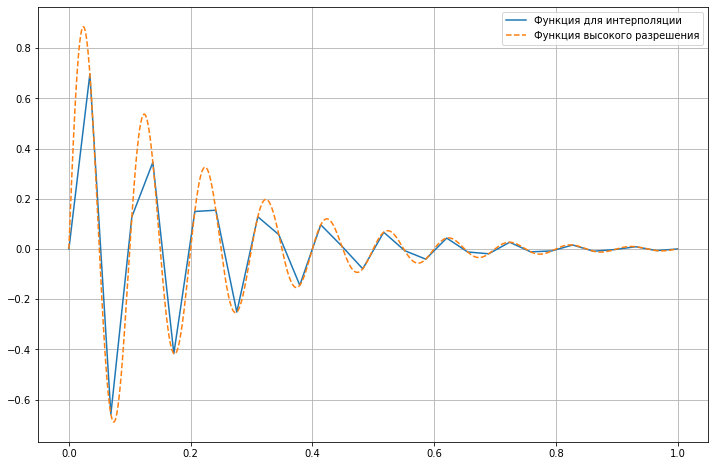

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from scipy import interpolate

w1 = 10    
a1 = 1     
Fs = 30 
Ts = 1.0/Fs
alpha = 5

## исходная ось (низкое разрешение)
t = np.linspace(0, 1, Fs)
## функция для интерполяции
y = a1*np.exp(-alpha*t) * np.sin(2*np.pi*w1*t) 
 

## интерполяционная сетка (высокое разрешение)
tt = np.linspace(0, 1, 100*Fs)
## функция высокого разрешения (пытаемся получить её интерполяцией)
y_high_res = a1*np.exp(-alpha*tt) * np.sin(2*np.pi*w1*tt) 

f, ax = plt.subplots(figsize=(12, 8))
ax.plot(t, y)
ax.plot(tt, y_high_res, '--')
ax.legend(['Функция для интерполяции', 'Функция высокого разрешения'])
ax.grid()
plt.show()

1. Проинтерполируйте функцию "y" на сетке "tt" кубическим сплайном, используйте для этого interpolate.interp1d. Укажите среднее квадратическое отклонение интерполированной функции от функции высокого разрешения y_high_res по формуле $MSE=\frac{1}{N}\sum_{1}^{N}(y_i−\hat{y}_i)^2$ , округлите до 5 знака после точки.

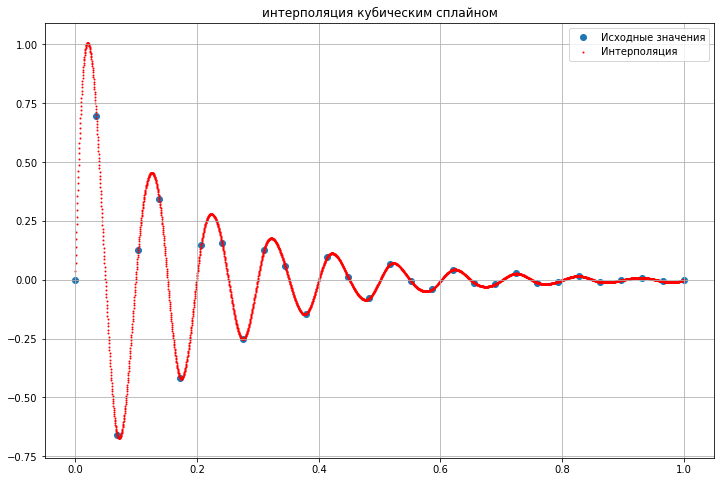

MSE: 0.00105


In [ ]:

w1 = 10    
a1 = 1     
Fs = 30 
Ts = 1.0/Fs
alpha = 5

## исходная ось (низкое разрешение)
t = np.linspace(0, 1, Fs)
## функция для интерполяции
y = a1*np.exp(-alpha*t) * np.sin(2*np.pi*w1*t) 
 

## интерполяционная сетка (высокое разрешение)
tt = np.linspace(0, 1, 100*Fs)

## создаём новый дейтафрейм для интерполированных значений
df_interp = pd.DataFrame()
df_interp['t'] = tt
## интерполируем значения исходного дейтафрейма на регулярной сетке
intp = interpolate.interp1d(t, y,kind= 'cubic')
df_interp['y'] = intp(tt)



## визуализируем
f, ax = plt.subplots(figsize=(12, 8))
ax.scatter(t, y)
ax.scatter(df_interp.t, df_interp.y, marker='.', c='r', s=4)
ax.grid()
ax.legend(['Исходные значения', 'Интерполяция'])
plt.title('интерполяция кубическим сплайном')
plt.show()
print('MSE:',round(1/df_interp['y'].shape[0]*sum((df_interp['y']-y_high_res)**2),5))

2. Проинтерполируйте пропущенные значения функции y_lost, используя метод interpolate с параметром nearest из пакета pandas и используя метод interpolate с параметром polynomial, order = 5. . Укажите среднее квадратическое отклонение интерполированной функции от исходной функции "y" $MSE=\frac{1}{N}\sum_{1}^{N}(y_i−\hat{y}_i)^2$ , округлите до 3 знака после точки.

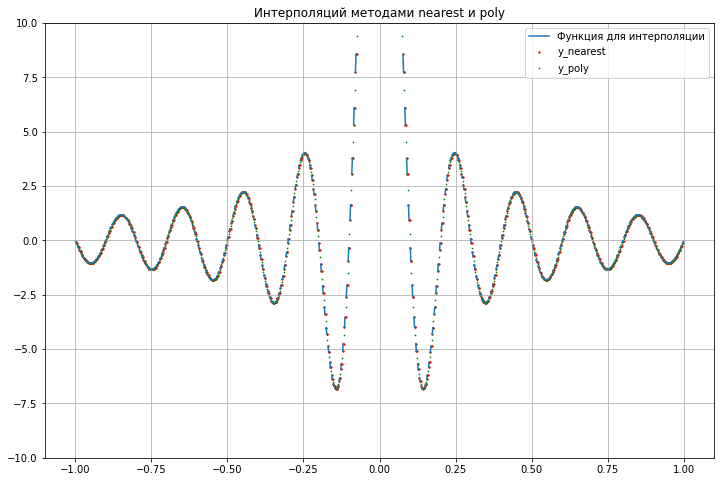

MSE_nearest: 0.021
MSE_poli: 0.0


,t,y,y_lost,y_nearest,y_poli
0,-1.000000,-1.224647e-15,NaN,NaN,-1.224647e-15
1,-0.997998,-6.297937e-02,-0.062979,-0.062979,-6.297937e-02
2,-0.995996,-1.259624e-01,-0.125962,-0.125962,-1.259624e-01
3,-0.993994,-1.887000e-01,NaN,-0.125962,-1.887000e-01
4,-0.991992,-2.509431e-01,-0.250943,-0.250943,-2.509431e-01
5,-0.989990,-3.124436e-01,-0.312444,-0.312444,-3.124436e-01
6,-0.987988,-3.729553e-01,NaN,-0.312444,-3.729553e-01
7,-0.985986,-4.322350e-01,-0.432235,-0.432235,-4.322350e-01
8,-0.983984,-4.900431e-01,-0.490043,-0.490043,-4.900431e-01
9,-0.981982,-5.461451e-01,NaN,-0.490043,-5.461451e-01


In [ ]:
w1 = 5   
a1 = 1     
Fs = 1000
Ts = 1.0/Fs
alpha = 5

df = pd.DataFrame()
## ось
df['t'] = np.linspace(-1, 1, Fs)
## функция для интерполяции
df['y'] = np.sin(2*np.pi*w1*df.t) / df.t 
 
## пропущенные значения    
df['y_lost'] = df.y
df.loc[0::3, 'y_lost'] = np.nan
df['y_nearest'] = df.y_lost.interpolate(method='nearest')
df['y_poli'] = df.y.interpolate(method='polynomial', order=5)

f, ax = plt.subplots(figsize=(12, 8))
ax.plot(df.t, df.y_lost)
ax.set_ylim([-10, 10])
ax.scatter(df.t, df.y_nearest, marker='.', c='r', s=7)
ax.scatter(df.t, df.y_poli, marker='.', c='green', s=2)

ax.legend(['Функция для интерполяции','y_nearest','y_poly'])
ax.grid()
plt.title('Интерполяций методами nearest и poly')
plt.show()
print('MSE_nearest:',round(1/df['y'].shape[0]*sum((df['y']-df['y_nearest'].fillna(-0.062979))**2),3))

print('MSE_poli:',round(1/df['y'].shape[0]*sum((df['y']-df['y_poli'])**2),5))
df.head(10)

## Увеличение/уменьшение разрешения (upsampling/downsampling)

**Необходимость изменения разрешения данных**

Иногда разрешение имеющихся данных не соответствует задаче. В этом случае нужно понизить или повысить разрешение данных.

*Например, когда необходимо построить прогноз цены акции по дням на всю следующую неделю. При этом у вас есть цена акции на каждую минуту. В этом случае вам не нужно работать с таким разрешением.* Сначала необходимо понизить разрешение данных до часового (1 точку каждый час) или дневного (1 точку каждый день) и уже с полученными данными работать. **Это задача понижения разрешения — downsampling.**

Или наоборот, вам необходимо знать значение переменной более часто, чем оно у вас есть. *Например, у вас есть данные по цене акции на каждый час, а вы хотите иметь данные на каждую минуту. Вы не можете просто повысить разрешение и получить эти данные.* Но можете построить недостающие данные с помощью интерполяции — upsampling.

**Задача повышения разрешения (upsampling) решается методом интерполяции данных и обычно связана с данными, заданными на нерегулярной сетке.**

### Понижение разрешения (downsampling)

В Pandas изменение разрешение делается при помощи метода resample().

In [ ]:
url = 'https://drive.google.com/file/d/1Zddn8j5wTfhdnrsDRxxkFMOpxCqWlx42/view?usp=sharing'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
df = pd.read_csv(path)
df['ts'] = pd.to_datetime(df.ts)
df.head()

,ts,open,high,low,close,vol
0,2018-01-02 02:01:00,1305.3,1305.9,1304.6,1304.7,407
1,2018-01-02 02:02:00,1304.7,1305.1,1304.7,1305.0,91
2,2018-01-02 02:03:00,1305.0,1305.4,1305.0,1305.4,42
3,2018-01-02 02:04:00,1305.4,1305.5,1305.1,1305.2,89
4,2018-01-02 02:05:00,1305.2,1305.2,1305.1,1305.1,23


Встроенный метод Plotly — Candlestick() — рисует японские свечи и автоматически добавляет ползунок под график для скроллинга.

In [ ]:
import plotly.graph_objects as go

## загружаем стоимость акций apple
## говорим методу Candlestick какие колонки дейтафрейма использовать
df2 = df.iloc[:1440]
data = [go.Candlestick(x      =df2['ts'],
                        open   =df2['open'],
                        high   =df2['high'],
                        low    =df2['low'],
                        close  =df2['close'])]
 ## отображаем фигуру с данными
fig = go.Figure(data)
fig.show() 

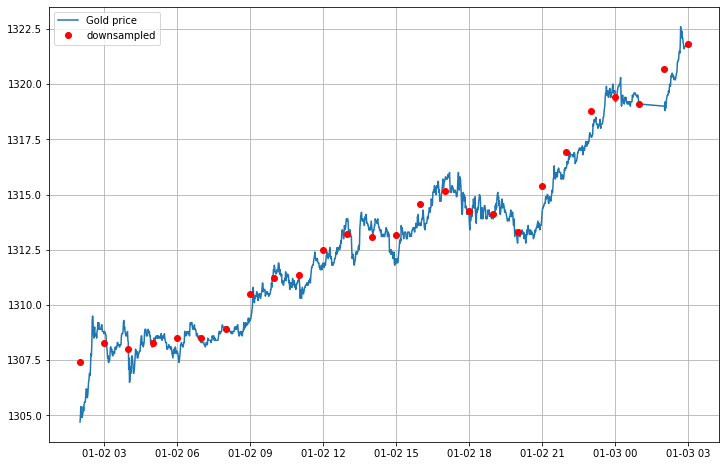

len(df) = 1440
len(downsampled) = 26


,ts,open,close,vol,high,low
0,2018-01-02 02:00:00,1305.3,1307.430508,5284,1309.7,1304.6
1,2018-01-02 03:00:00,1308.8,1308.258333,4906,1309.3,1307.3
2,2018-01-02 04:00:00,1308.4,1308.000000,7923,1309.0,1306.2
3,2018-01-02 05:00:00,1308.0,1308.266667,4039,1308.7,1307.4
4,2018-01-02 06:00:00,1307.8,1308.513559,4529,1309.3,1307.3


In [ ]:
df = df.iloc[:1440]

## cвоя функция аггреагции: возвращаем наименьшее значение
def myFunc(value):
    return min(value)

## определяем, как аггрегировать данные в колонках
conversion = {
    'open' :  'first', ## для цены открытия берём первое значение 
    'close':  'mean',  ## для цены закрытия - cреднее
    'vol'  :  'sum',   ## суммируем объёмы сделок в этот час
    'high' :  'max',   ## берём максимум пикового значения
    'low'  :  myFunc   ## можно определить свою функцию аггрегации для наименьшого значения
}

## downsampling будем проводить по переменной времени - ts
df = df.set_index('ts')
## уменьшаем частоту данных до 1 часа, аггрегируем данные, как описано выше
downsampled = df.resample('1H').apply(conversion)
## возвращаем время ts из индекса в отдельную колонку
df = df.reset_index()
downsampled = downsampled.reset_index()

## визуализируем
f, ax = plt.subplots(figsize=(12, 8))
ax.plot(df.ts, df.close)
ax.plot(downsampled.ts, downsampled.close, c='r', marker='o', lw=0)
ax.legend(['Gold price', 'downsampled'])
ax.grid()
plt.show()
print(f'len(df) = {len(df)}')
print(f'len(downsampled) = {len(downsampled)}')
downsampled.head()

#### Задача

Понизьте разрешение ряда с 1 минуты до 8 часов. Результат округлите до пятого знака после запятой.

1. Аггрегируйте цену open, взяв её медиану.
Укажите результирующую цену open в момент времени 2017-01-02 16:00:00
2. Аггрегируйте цену close, взяв её среднее значение.
Укажите результирующую цену сlose в момент времени 2017-01-02 16:00:00
3. Аггрегируйте цену high, взяв её максимальное значение.
Укажите результирующую цену high в момент времени 2017-01-04 00:00:00
4. Аггрегируйте цену low, взяв её минимальное значение.
Укажите результирующую цену low в момент времени 2017-01-04 00:00:00
5. Аггрегируйте объём сделок vol, взяв половину от суммы его медианного и среднего значений.
Округлите значения до первого знака после запятой. Укажите результирующий объём в момент времени 2017-01-05 08:00:00

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import time, datetime

In [ ]:
url = 'https://drive.google.com/file/d/1BDSoed8jd7HbdwU_cs6zTAYATW-Q--cd/view?usp=sharing'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
data = pd.read_csv(path)
data['ts'] = pd.to_datetime(data.ts)
print(f'data.shape = {data.shape}')
data.head()

data.shape = (121674, 6)


,open,high,low,close,vol,ts
0,1.05135,1.05192,1.05134,1.05187,65,2017-01-02 09:00:00
1,1.05185,1.05198,1.05153,1.05168,58,2017-01-02 09:01:00
2,1.05175,1.05201,1.05149,1.05154,33,2017-01-02 09:02:00
3,1.05177,1.05202,1.05177,1.05200,20,2017-01-02 09:03:00
4,1.05202,1.05202,1.05198,1.05202,7,2017-01-02 09:04:00


In [ ]:
df = data.copy()
df = df[df.ts > '2017-01-02']
data_ = [go.Candlestick(x      =df['ts'],
                        open   =df['open'],
                        high   =df['high'],
                        low    =df['low'],
                        close  =df['close'])]
 ## отображаем фигуру с данными
fig = go.Figure(data_)
fig.show() 

/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:170: RuntimeWarning:

invalid value encountered in double_scalars



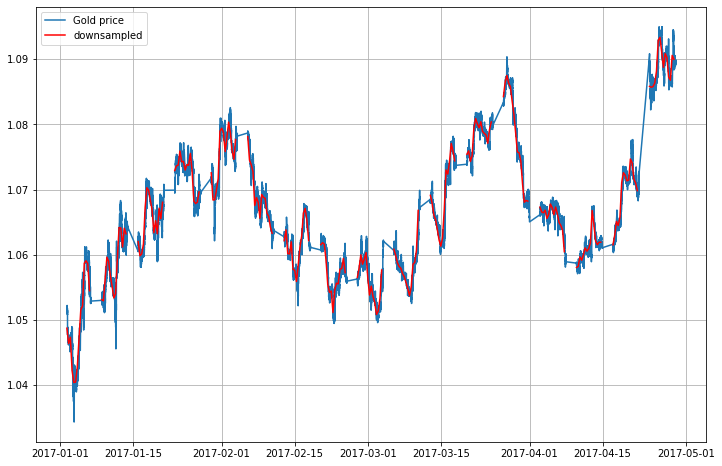

len(df) = 121674
len(downsampled) = 350
                   ts     close     high      low     open         vol
1 2017-01-02 16:00:00  1.046375  1.04773  1.04498  1.04649  144.962264
          ts     close     high      low     open         vol
5 2017-01-04  1.040474  1.04236  1.03898  1.04043  285.967708
                   ts    close     high      low     open        vol
9 2017-01-05 08:00:00  1.05214  1.05743  1.04823  1.05116  481.33438


,ts,close,high,low,open,vol
0,2017-01-02 08:00:00,1.048734,1.05233,1.04617,1.048130,219.877108
1,2017-01-02 16:00:00,1.046375,1.04773,1.04498,1.046490,144.962264
2,2017-01-03 00:00:00,1.047341,1.04900,1.04531,1.047480,240.074113
3,2017-01-03 08:00:00,1.042183,1.04889,1.03748,1.041110,428.573958
4,2017-01-03 16:00:00,1.040398,1.04332,1.03402,1.040885,377.388542


In [ ]:
def myFunc(value):
    return 0.5*(np.mean(value)+np.median(value))



## определяем, как аггрегировать данные в колонках
conversion = {
    'close' :  'mean',
     'high' :  'max',
    'low' :  'min',
    'open' :  'median', 
    'vol'  :  myFunc   ## можно определить свою функцию аггрегации для наименьшого значения
}

## downsampling будем проводить по переменной времени - ts
df = df.set_index('ts')
## уменьшаем частоту данных до 8 часов, аггрегируем данные, как описано выше
downsampled = df.resample('8H').apply(conversion)
## возвращаем время ts из индекса в отдельную колонку
df = df.reset_index()
downsampled = downsampled.reset_index()

## визуализируем
f, ax = plt.subplots(figsize=(12, 8))
ax.plot(df.ts, df.close)
ax.plot(downsampled.ts, downsampled.close, c='r')
ax.legend(['Gold price', 'downsampled'])
ax.grid()
plt.show()
print(f'len(df) = {len(df)}')
print(f'len(downsampled) = {len(downsampled)}')
print(round(downsampled.loc[downsampled.ts=='2017-01-02 16:00:00'],6))
print(round(downsampled.loc[downsampled.ts=='2017-01-04 00:00:00'],6))
print(round(downsampled.loc[downsampled.ts=='2017-01-05 08:00:00'],5))
downsampled.head()


### Повышение разрешения (Upsampling)

Фактически это интерполяция

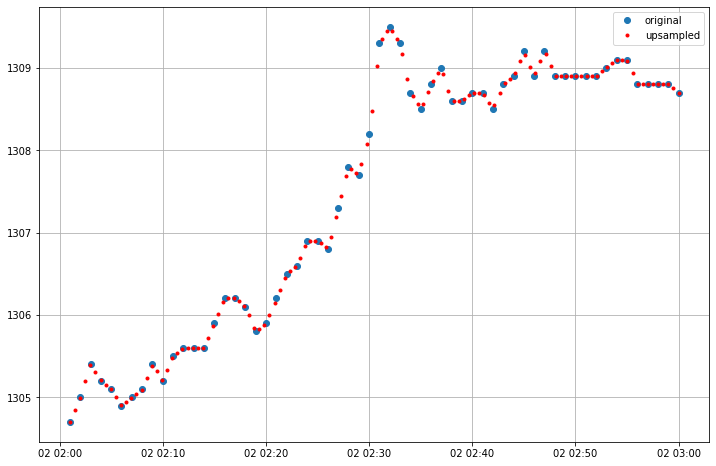

In [ ]:
df = pd.read_csv(path)
df['unixtime'] = df.ts
## преобразуем юниксовое время в таймстемп
df['ts'] = pd.to_datetime(df.ts)
## возьмём только первый час данных (60 минут)
df = df.iloc[:60]

## cделаем интерполяционную сетку, 120 значений (каждые 30 секунд)
## np.interp не умеет работать с таймстемпами, поэтому будем использовать
## юниксовое время, являющееся просто int
ti = np.linspace(df.unixtime.min(), df.unixtime.max(), 120)
## интерполируем
upsampled = np.interp(ti, df.unixtime, df.close)
## переведём интерполяционную сетку в таймстемп
ts = pd.to_datetime(ti)

## визуализируем
f, ax = plt.subplots(figsize=(12, 8))
## исходные данные
ax.plot(df.ts, df.close, marker='o', lw=0)
## красными кружками помечаем моменты, в которые мы теперь имеем данные
ax.plot(ts, upsampled, c='r', marker='o', lw=0, markersize=3)
ax.legend(['original', 'upsampled'])
ax.grid()
plt.show()

#### Задача

Отфильтруйте ряд, оставив в нём лишь цены до 2017-01-03 включительно.

Используя те же аггрегирующие функции, при помощи функции resample повысьте разрешение отфильтрованного ряда до 10 секунд.

6. Укажите количество отсутствующих данных в колонке open.
7. Используя метод pandas.Series.interpolate, линейно проинтерполируйте колонку цен открытия - open. Укажите значение цены открытия в момент времени 2017-01-02 09:00:40, результат округлите до шестого знака после запятой.

In [ ]:
df2 = data.copy()
## преобразуем юниксовое время в таймстемп
df2['ts'] = pd.to_datetime(df2.ts)
df2['unixtime'] = df2.ts.astype(np.int64)
df2 = df2[df2.ts <= '2017-01-03 00:00:00']
# print(df2.shape,'min:',df2.ts.min(),'max:',df2.ts.max())

def myFunc(value):
    return 0.5*(np.mean(value)+np.median(value))



## определяем, как аггрегировать данные в колонках
conversion = {
    'close' :  'mean',
     'high' :  'max',
    'low' :  'min',
    'open' :  'median', 
    'vol'  :  myFunc   ## можно определить свою функцию аггрегации для наименьшого значения
}

## downsampling будем проводить по переменной времени - ts
df2 = df2.set_index('ts')
## уменьшаем частоту данных до 8 часов, аггрегируем данные, как описано выше
downsampled = pd.DataFrame()
downsampled = df2.resample('10s').apply(conversion)
## возвращаем время ts из индекса в отдельную колонку
df2 = df2.reset_index()
downsampled = downsampled.reset_index()


# print(downsampled.isnull().sum())
# downsampled['open'] = downsampled['open'].interpolate(method='linear')

downsampled['close'] = downsampled['close'].interpolate(method='nearest')
# print(round(downsampled.loc[downsampled.ts=='2017-01-02 09:00:40','open'],6))
print(round(downsampled.loc[downsampled.ts=='2017-01-02 09:00:40','close'],5))

downsampled.head(10)


/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:170: RuntimeWarning:

invalid value encountered in double_scalars



4    1.05168
Name: close, dtype: float64


,ts,close,high,low,open,vol
0,2017-01-02 09:00:00,1.05187,1.05192,1.05134,1.05135,65.0
1,2017-01-02 09:00:10,1.05187,NaN,NaN,NaN,NaN
2,2017-01-02 09:00:20,1.05187,NaN,NaN,NaN,NaN
3,2017-01-02 09:00:30,1.05187,NaN,NaN,NaN,NaN
4,2017-01-02 09:00:40,1.05168,NaN,NaN,NaN,NaN
5,2017-01-02 09:00:50,1.05168,NaN,NaN,NaN,NaN
6,2017-01-02 09:01:00,1.05168,1.05198,1.05153,1.05185,58.0
7,2017-01-02 09:01:10,1.05168,NaN,NaN,NaN,NaN
8,2017-01-02 09:01:20,1.05168,NaN,NaN,NaN,NaN
9,2017-01-02 09:01:30,1.05168,NaN,NaN,NaN,NaN


При помощи функции np.linspace создайте сетку, состоящую из 135 точек во времени (используя колонку unixtime). После чего, используя функцию np.interp, проинтерполируйте значения колонки close на созданной сетке.

Укажите среднее значение интерполированного ряда, округлив его до шестого знака после запятой.

In [ ]:
df3 = data.copy()
df3['ts'] = pd.to_datetime(df3.ts)

df3 = df3[(df3.ts >= '2017-01-05 12:00:00') & (df3.ts <= '2017-01-05 13:00:00')]
df3['unixtime'] = df3.ts.astype(np.int64)





## cделаем интерполяционную сетку, 120 значений (каждые 30 секунд)
## np.interp не умеет работать с таймстемпами, поэтому будем использовать
## юниксовое время, являющееся просто int
ti = np.linspace(df3.unixtime.min(), df3.unixtime.max(), 135)
## интерполируем
upsampled = np.interp(ti, df3.unixtime, df3.close)
## переведём интерполяционную сетку в таймстемп
ts = pd.to_datetime(ti)
round(upsampled.mean(),6)

## Оконные функции

**Оконная функция** — это любая функция, вычисленная не на всех данных, а на некотором отрезке («окне»).

Если временной ряд изменяется во времени, то часто не имеет смысла говорить о его, например, среднем значении в целом, но имеет смысл рассматривать его среднее значение на конкретном промежутке времени.

На каждом окне вычисляется одна точка — среднее значение этого окна. После этого окно сдвигается на одну точку вправо и процедура повторяется. 

<font color='blue'>При помощи оконных функций можно делать сглаживания временных рядов, что требуется, когда в данных есть шумы. А поскольку шумы в данных появляются часто, то и задача сглаживания является типичной задачей обработки временных рядов. </font>

### Простое скользящее среднее

Простое скользящее среднее (англ. Simple Moving Average или SMA) имеет следующий вид:

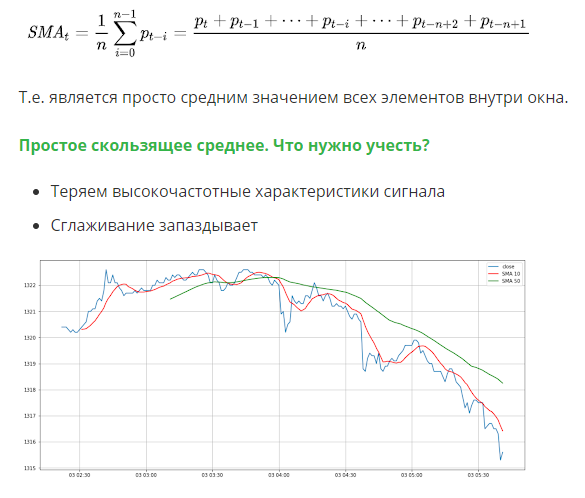



### **Экспоненциальное скользящее среднее**

Если более свежие данные для нас важнее старых, то применяется экспоненциальное скользящее среднее: новые значения имеют больший вес.

**Формула для экспоненциального среднего (Exponential Moving Average или EMA):**

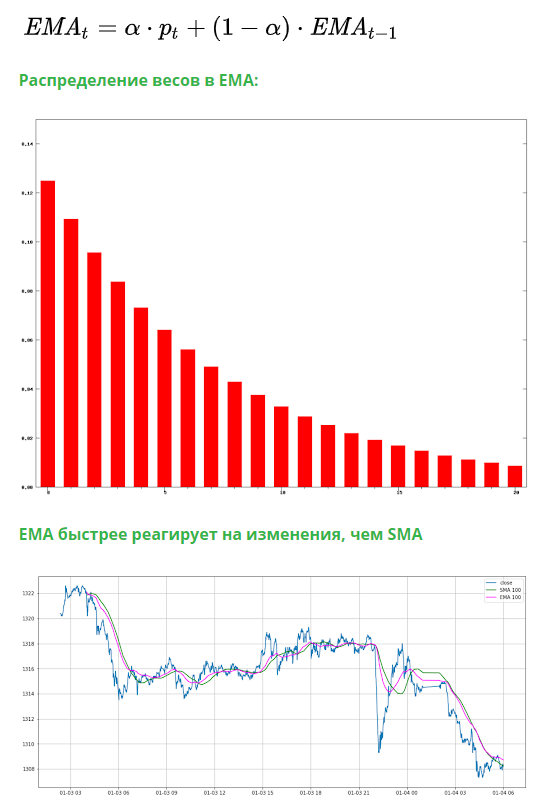

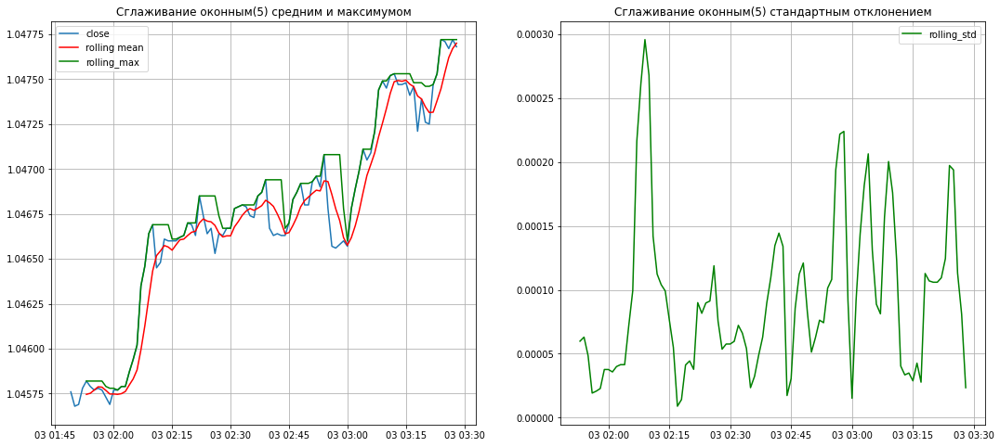

,open,high,low,close,vol,ts,rolling_mean_100,rolling_ema_100
1400,1.04872,1.04872,1.04868,1.04870,140,2017-01-03 08:29:00,NaN,NaN
1401,1.04870,1.04876,1.04870,1.04873,219,2017-01-03 08:30:00,NaN,NaN
1402,1.04873,1.04877,1.04873,1.04876,302,2017-01-03 08:31:00,NaN,NaN
1403,1.04876,1.04881,1.04868,1.04879,262,2017-01-03 08:32:00,NaN,NaN
1404,1.04879,1.04881,1.04877,1.04879,270,2017-01-03 08:33:00,NaN,NaN
1405,1.04879,1.04885,1.04876,1.04877,324,2017-01-03 08:34:00,NaN,NaN
1406,1.04877,1.04880,1.04869,1.04871,267,2017-01-03 08:35:00,NaN,NaN
1407,1.04871,1.04874,1.04863,1.04863,253,2017-01-03 08:36:00,NaN,NaN
1408,1.04863,1.04864,1.04857,1.04859,207,2017-01-03 08:37:00,NaN,NaN
1409,1.04859,1.04859,1.04842,1.04842,140,2017-01-03 08:38:00,NaN,NaN


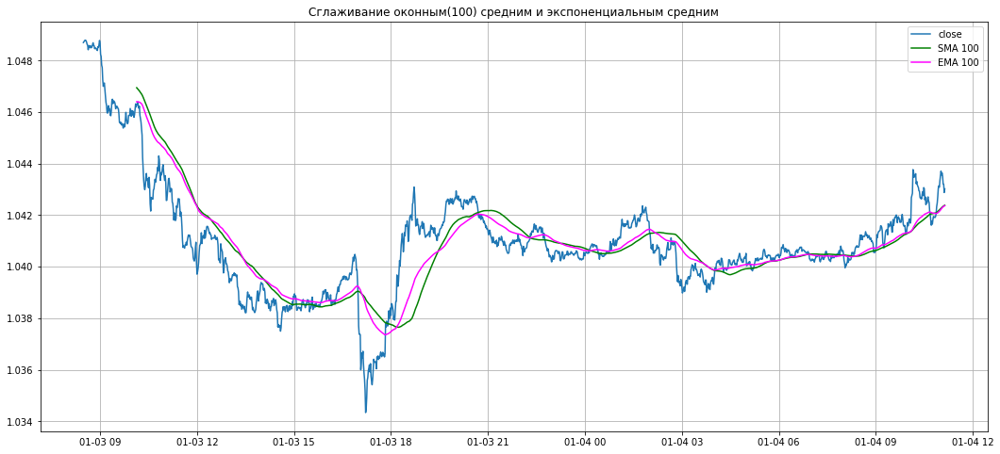

In [4]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt 

url = 'https://drive.google.com/file/d/1BDSoed8jd7HbdwU_cs6zTAYATW-Q--cd/view?usp=sharing'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
data = pd.read_csv(path)
data['ts'] = pd.to_datetime(data.ts)
df=data.copy()
df = df.iloc[1000:1100]
df = df.reset_index(drop=True)

def myMax(value):
    return max(value)

## делаем оконное среднее с окном в 10 точек
df['rolling_mean'] = df.close.rolling(window=5).mean()
df['rolling_std']  = df.close.rolling(window=5).std()
df['rolling_max']  = df.close.rolling(window=5).apply(myMax, raw=False)

## визуализируем
f, ax = plt.subplots(1, 2, figsize=(18, 8))
ax[0].plot(df.ts, df.close) ## исходные данные
ax[0].plot(df.ts, df.rolling_mean, c='r') ## оконное среднее
ax[0].plot(df.ts, df.rolling_max,  c='g') ## оконный максимум
ax[0].legend(['close', 'rolling mean','rolling_max'])
ax[0].set_title('Сглаживание оконным(5) средним и максимумом')
ax[0].grid()

ax[1].plot(df.ts, df.rolling_std, c='g') ## оконное стандартное отклонение
ax[1].grid()
ax[1].legend(['rolling_std'])
ax[1].set_title('Сглаживание оконным(5) стандартным отклонением')
plt.show()

df=data.copy()
df = df.iloc[1400:3000]
N = 100

## делаем оконное среднее с окном в N точек
df['rolling_mean_' + str(N)] = df.close.rolling(window=N).mean()
## экспоненциально среднее с окном в N точек
df['rolling_ema_' + str(N)] = df.close.ewm(min_periods=N, span=N).mean()

## визуализируем
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df.ts, df.close) ## исходные данные
# ax.plot(df.ts, df.rolling_mean_10, c='r') ## оконное среднее
ax.plot(df.ts, df['rolling_mean_' + str(N)],  c='g') ## оконное среднее
ax.plot(df.ts, df['rolling_ema_'  + str(N)],  c='magenta') ## оконное среднее
ax.legend(['close', 'SMA ' + str(N), 'EMA ' + str(N)])
ax.set_title('Сглаживание оконным(100) средним и экспоненциальным средним')
ax.grid()
df.head(12)

Видно, что экспоненциальное среднее быстрее улавливает изменения в данных, тк последние по времении данные в этом показателе имеют больший вес

### Задача

1. Постройте скользящее среднее на колонке с ценами закрытия (close) с окном в 100. Укажите, округлённое до одного знака после запятой, значение скользящего среднего в момент, когда оно впервые оказывается меньше значения close.

2. Постройте скользящее квадратическое отклонение на колонке с ценами закрытия (close) с окном в 100. Укажите, округлённое до четырёх знаков после запятой, значение скользящего квадратического отклонения в момент, когда оно впервые становится не NaN.

3. Постройте так называемые линии Боллинджера: добавьте к скользящему среднему скользящее стандартное отклонение, умноженное на три - верхняя линия Боллинджера; отнимите от скользящего среднего скользящее стандартное отклонение, умноженное на три - нижняя линия Боллинджера.

  upper = rolling_mean + 3 * rolling_std

  lower = rolling_mean - 3 * rolling_std

  Укажите, сколько точек колонки close лежат выше, чем верхняя линия Боллинджера? И сколько точек той же колонки лежат ниже, чем нижняя линия Боллинджера?

4. Напишите свою скользящую функцию, которая будет являтся средним арифметическим между максимальным и минимальным значением цены закрытия close, используя окно 50. Укажите последнее значение этой функции.

5. Постройте скользящее среднее с окном 500 и экспоненциальное скользящее среднее с окном 100 (span=100). Укажите индексы дейтафрейма(1й и 2й), на которых одно скользящее пересекается с другим. Для этого вычтите из одно скользящего среднего другое, возьмите знак этой разности (np.sign), продифференциируйте его (diff()) и оставьте только те точки, где результат дифференциирования не равен нулю.

1: 1311.3
2: 1.0449
3: 15 6
4: 1318.85
5: [ 604 1092]


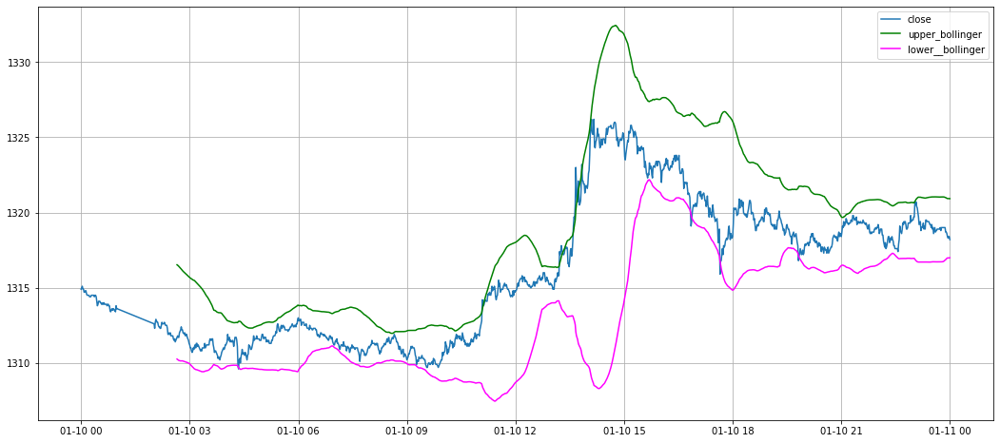

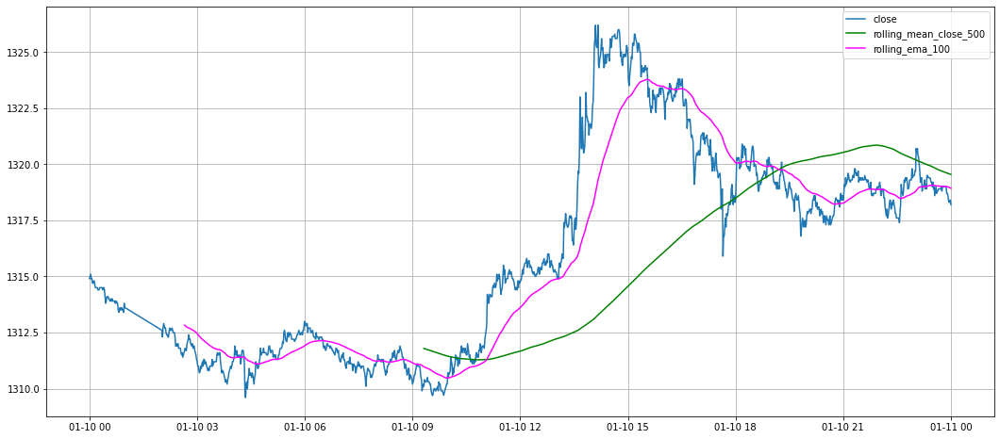

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import time, datetime

url = 'https://drive.google.com/file/d/1Zddn8j5wTfhdnrsDRxxkFMOpxCqWlx42/view?usp=sharing'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
data = pd.read_csv(path)
data = data.rename(columns = {'ts': 'unixtime'})
data['ts'] = pd.to_datetime(data.unixtime)
data = data[(data.ts >= '2018-01-10') & (data.ts <= '2018-01-11')]

data = data.reset_index(drop=True)
N = 100

## делаем оконное среднее с окном в N точек
data['rolling_mean_close_' + str(N)] = data.close.rolling(window=N).mean()
data['rolling_std_close_' + str(N)] = data.close.rolling(window=N).std()
data['upper'] = data['rolling_mean_close_' + str(N)] + 3*data['rolling_std_close_' + str(N)]
data['lower'] = data['rolling_mean_close_' + str(N)] - 3*data['rolling_std_close_' + str(N)]
print('1:',round(data[data['rolling_mean_close_' + str(N)]<data.close].iloc[0]['rolling_mean_close_' + str(N)],1))
print('2:',round(data[data['rolling_std_close_' + str(N)].isna()==False].iloc[0]['rolling_std_close_' + str(N)],4))
print('3:',data[data.close>data.upper].shape[0], data[data.close<data.lower].shape[0])
data.head()


def myFunc(value):
    return (max(value)+min(value))*0.5

data['rolling_my_func_50']  = data.close.rolling(window=50).apply(myFunc, raw=False)
print('4:',data.rolling_my_func_50.iloc[-1])
## визуализируем
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(data.ts, data.close) ## исходные данные
# ax.plot(df.ts, df.rolling_mean_10, c='r') ## оконное среднее
ax.plot(data.ts, data['upper'],  c='g') ## оконное среднее
ax.plot(data.ts, data['lower'],  c='magenta') ## оконное среднее
ax.legend(['close', 'upper_bollinger', 'lower__bollinger'])
ax.grid()

data['rolling_mean_close_500'] = data.close.rolling(window=500).mean()
## экспоненциально среднее с окном в N точек
data['rolling_ema_' + str(N)] = data.close.ewm(min_periods=N, span=N).mean()
np.diff(np.sign(data['rolling_mean_close_500']-data['rolling_ema_' + str(N)]))
s = np.argwhere(np.diff(np.sign(data['rolling_mean_close_500']-data['rolling_ema_' + str(N)])))
print('5:',s[s>500])#первые 500 значений nan
## визуализируем
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(data.ts, data.close) ## исходные данные
# ax.plot(df.ts, df.rolling_mean_10, c='r') ## оконное среднее
ax.plot(data.ts, data['rolling_mean_close_500'],  c='g') ## оконное среднее
ax.plot(data.ts, data['rolling_ema_100'],  c='magenta') ## оконное среднее
ax.legend(['close', 'rolling_mean_close_500', 'rolling_ema_100'])
ax.grid()

## Цифровые фильтры

**Фурье-образ**

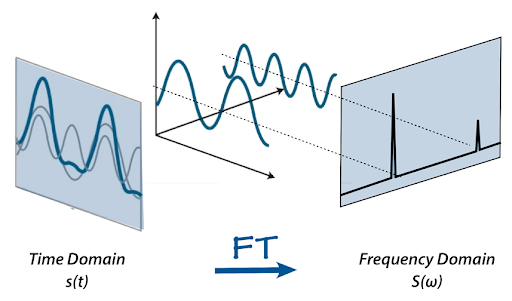

**Вейвлет-преобразование**
Наиболее часто используемое преобразование после Фурье.

Вейвлет-преобразование, в отличие от преобразования Фурье, может использоваться при пространственном распределении сигнала.

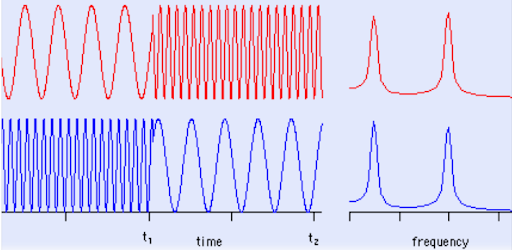
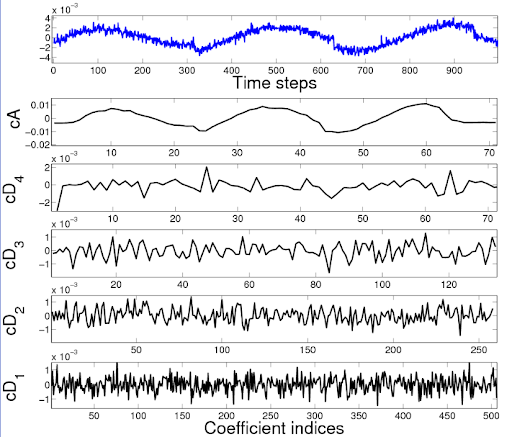

### Фильтры низких частот

**Фильтр низких частот ропускает низкие частоты**
Одна из наиболее частых задач при фильтрации — убрать высокочастотные шумы из сигнала.  Мы делали это при помощи скользящих средних. *То есть простое, экспоненциальное скользящее среднее — это ни что иное, как фильтры низких частот.*

ФНЧ можно представить себе как эквалайзер.
На следующем графике представлен исходный трехкомпонентный сигнал с частотами 10 Гц, 100 Гц и 350 Гц. Ниже представлена его амплитудно-частотная характеристика (АЧХ).
Чтобы вырезать высокие частоты, убрать 100 Гц и 350 Гц, и оставить только основной 10 Гц, мы применяем фильтр, у которого АЧХ выглядит следующим образом: изначально амплитуда равна 1 до частоты 25 Гц, после чего она становится отрицательной, то есть мы давим все, что в этой частотной области.
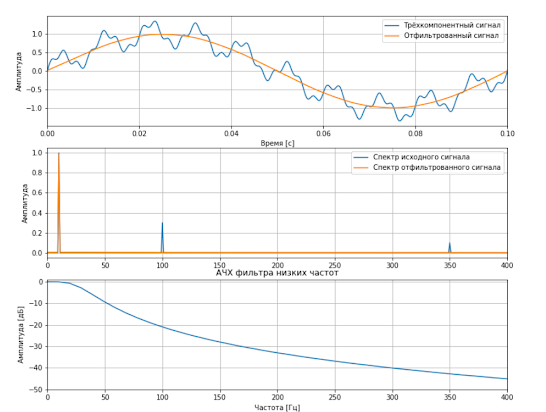

**Скользящие средние — частный случай ФНЧ**

Скользящие средние фильтруют сигнал, убирая высокие частоты.

На графике представлен исходный двухкомпонентный сигнал. Если посчитаем для этого графика ЕМА и SMA, то увидим, как они сглаживают этот  сигнал. 


В данном случае SMA полностью вырезает пик на частоте 196 Гц, а ЕМА почти убирает его. То есть ЕМА не полностью давит эту частоту. 

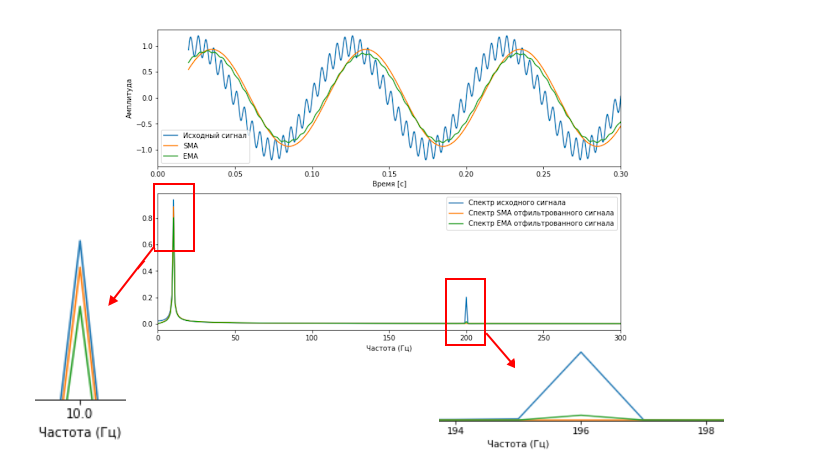

**Амплитудно-частотная характеристика (АЧХ) скользящих средних**

Чем больше размер окна скользящего среднего, тем сильнее подавляются высокие частоты.

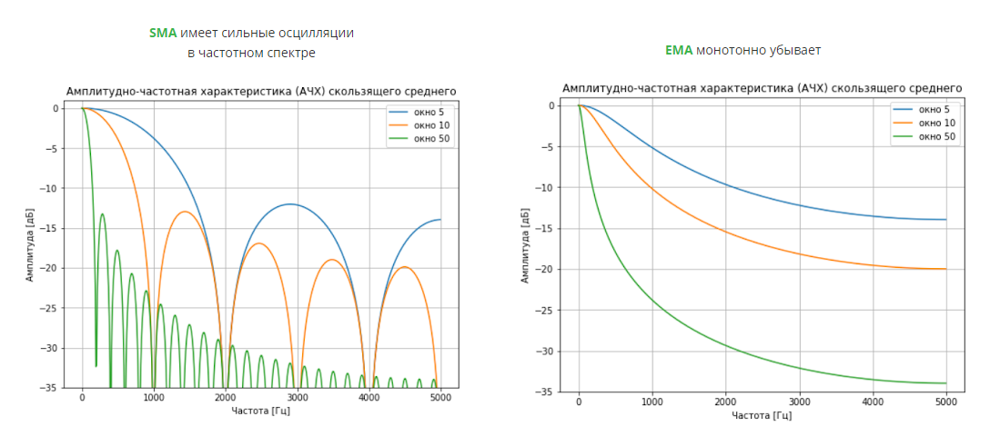

**Основные цифровые фильтры низких частот:**

- Фильтр Баттерворта характеризуется наименьшими искажениями в полосе пропускания. 

- Фильтр Чебышёва II рода хорошо работает, если полезный сигнал и шум находятся близко в частотной области.

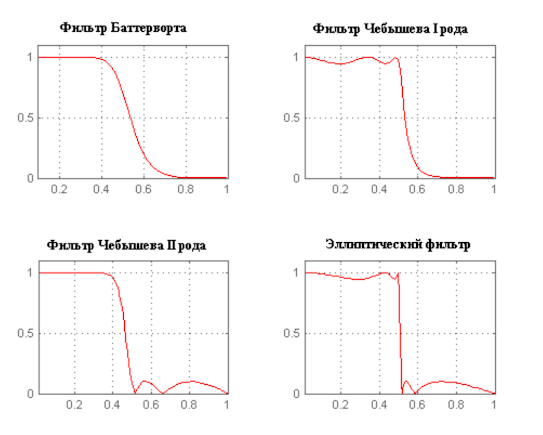

Text(0.5, 1.0, 'Исходные данные')

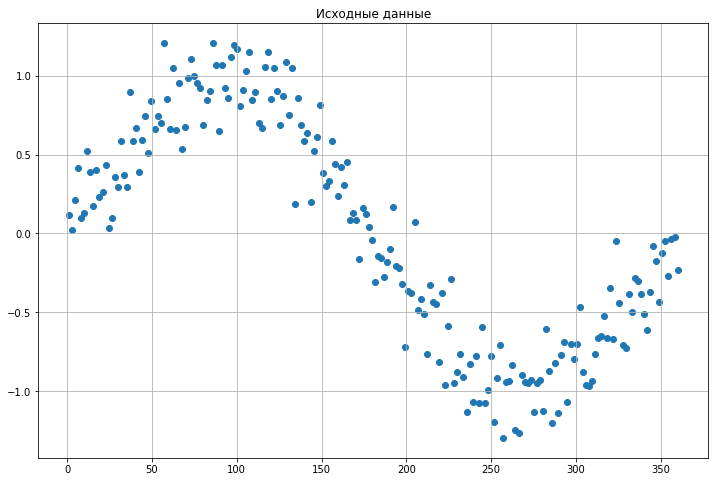

In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt 

N = 200
alpha = 0.2
np.random.seed(42)

df = pd.DataFrame()
## создаём 360 точек для оси времени
df['t'] = np.linspace(1, 360, N)
## cтроим синус на этих точках
df['y'] = np.sin(df.t * np.pi / 180)
## добавляем шум в данные
df['y'] = df.y + alpha*np.random.randn(N)

## визуализируем ряд
f, ax = plt.subplots(figsize=(12, 8))
ax.scatter(df.t, df.y)
ax.grid()
plt.title('Исходные данные')



Фильр Баттерворта

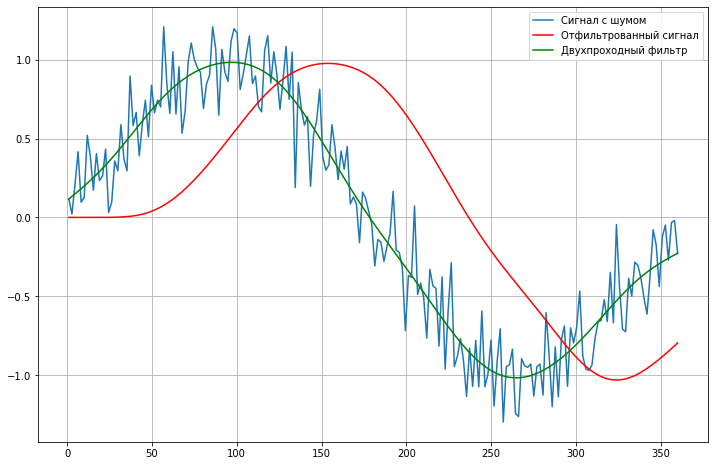

In [ ]:
from scipy import signal
## создаём фильтр ("фильтр Баттерворта")
b, a = signal.butter(8, 0.05)
## применяем его
df['y_filt'] = signal.lfilter(b, a, df.y)
df['y_filt_double'] = signal.filtfilt(b, a, df.y, padlen=150)

f, ax = plt.subplots(figsize=(12, 8))
ax.plot(df.t, df.y)
ax.plot(df.t, df.y_filt, 'r')
ax.plot(df.t, df.y_filt_double, 'g')
ax.legend(['Сигнал с шумом', 'Отфильтрованный сигнал', 'Двуxпроходный фильтр'])
ax.grid()

Преобразование Фурье

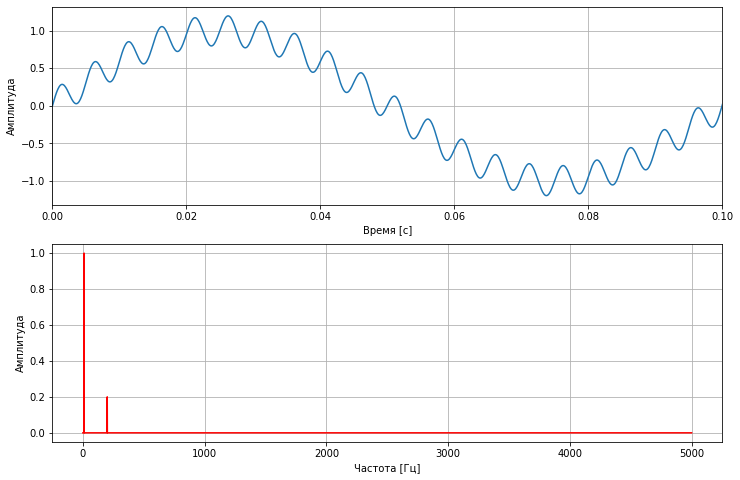

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

w1 = 10   ## частота первого синуса: 10 Гц
w2 = 200  ## частота второго синуса: 150 Гц
a1 = 1    ## амплитуда первого синуса
a2 = 0.2  ## амплитуда второго синуса
Fs = 10000  ## частота дискретизации: 10 кГц
Ts = 1.0/Fs ## интервал времени между соседними точками

df = pd.DataFrame()
## ось времени
df['t'] = np.arange(0, 1, Ts)
## cигнал
df['y'] = a1*np.sin(2*np.pi*w1*df.t) + a2*np.sin(2*np.pi*w2*df.t) 

N = len(df)
## создаём сетку частот
frq = np.fft.fftfreq(N, Ts)
## нас интересуют только положительные частоты (отрицательные частоты симметричны) 
frq = frq[range(int(N/2))]

## делаем преобразование Фурье
Y = 2/N * np.fft.fft(df.y)
## нас интересуют только положительные частоты (отрицательные частоты симметричны) 
Y = Y[range(int(N/2))]

## визуализируем
fig, ax = plt.subplots(2, 1, figsize=(12, 8))
ax[0].plot(df.t, df.y)
ax[0].set_xlim([0, 0.1])
ax[0].set_xlabel('Время [c]')
ax[0].set_ylabel('Амплитуда')
ax[0].grid()

ax[1].plot(frq, abs(Y), 'r') 
ax[1].set_xlabel('Частота [Гц]')
ax[1].set_ylabel('Амплитуда')
# ax[1].set_xlim([-200, 200])
ax[1].grid()

data = df.copy()

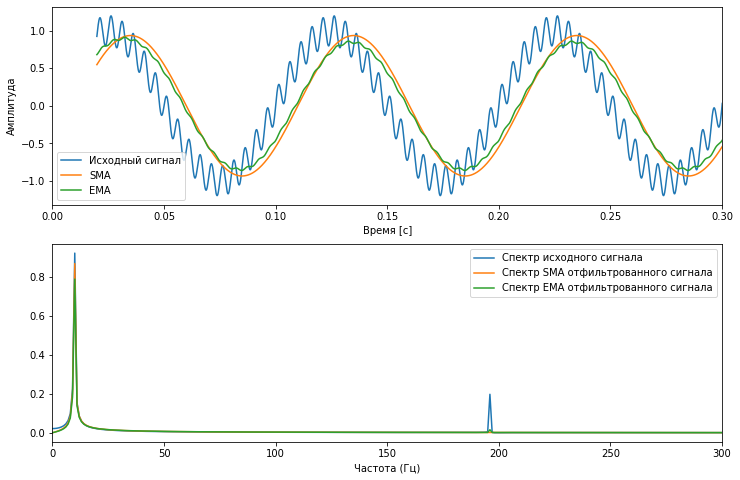

In [ ]:
df = data.copy()

K = 200
## делаем оконное среднее с окном в K точек
df['rolling_mean_' + str(K)] = df.y.rolling(window=K).mean()
## экспоненциально среднее с окном в K точек
# df['rolling_ema_' + str(K)] = df.y.ewm(min_periods=K, span=K).mean()
df['rolling_ema_' + str(K)] = df.y.ewm(min_periods=K, alpha=0.01).mean()

## FFT не работает с пропущенными данными
df = df.dropna()

Y = 2/N * np.fft.fft(df.y)[range(int(N/2))]
Y_sma = 2/N * np.fft.fft(df['rolling_mean_' + str(K)])[range(int(N/2))]
Y_ema = 2/N * np.fft.fft(df['rolling_ema_' + str(K)])[range(int(N/2))]

frq = np.fft.fftfreq(N, Ts)[range(int(N/2))]

fig, ax = plt.subplots(2, 1, figsize=(12, 8))
ax[0].plot(df.t, df.y)
ax[0].plot(df.t, df['rolling_mean_' + str(K)])
ax[0].plot(df.t, df['rolling_ema_' + str(K)])
ax[0].legend(['Исходный сигнал', 'SMA', 'EMA'])
ax[0].set_xlim([0, 0.3])
ax[0].set_xlabel('Время [c]')
ax[0].set_ylabel('Амплитуда')

ax[1].plot(frq, abs(Y)) 
ax[1].plot(frq, abs(Y_sma)) 
ax[1].plot(frq, abs(Y_ema)) 
ax[1].set_xlim([0, 300])
ax[1].set_xlabel('Частота (Гц)')
ax[1].legend(['Спектр исходного сигнала', 'Спектр SMA отфильтрованного сигнала', 'Спектр EMA отфильтрованного сигнала'])
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  


Подавление сигнала на частоте 200 Гц: -32.5 дБ  (в 42.2 раз)
Подавление сигнала на частоте 200 Гц: -21.8 дБ  (в 12.3 раз)


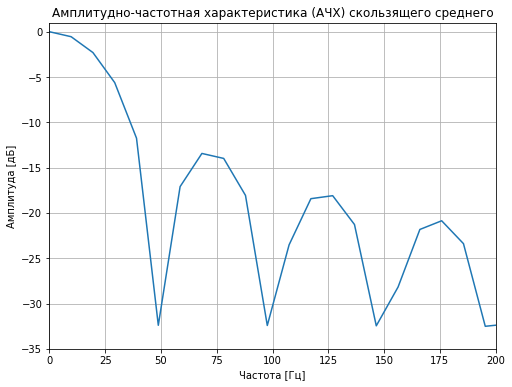

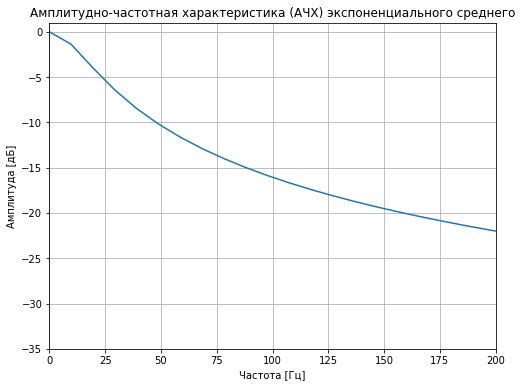

In [ ]:
from scipy import signal
b = [1 / K] * K
w, h = signal.freqz(b, 1)
w = Fs/np.pi/2 * w

## график Боде
f, ax = plt.subplots(figsize=(8, 6))
ax.plot(w, 20 * np.log10(abs(h)))
ax.set_ylabel('Амплитуда [дБ]')
ax.set_xlim([0, 200])
ax.set_ylim([-35, 1])
ax.set_xlabel('Частота [Гц]')
ax.set_title('Амплитудно-частотная характеристика (АЧХ) скользящего среднего')
ax.grid()

ind = np.where((w > w2-5) & (w < w2+5))[0][0]
print(f'Подавление сигнала на частоте {w2} Гц: {20 * np.log10(abs(h[ind])):.1f} дБ  (в {1/abs(h[ind]):0.1f} раз)')

alpha = 2 / (K+1)
# https://tttapa.github.io/Pages/Mathematics/Systems-and-Control-Theory/Digital-filters/Exponential%20Moving%20Average/Exponential-Moving-Average.html
b = np.array(alpha)
a = np.array((1, alpha - 1))

## получить частотную характеристику фильтра
w, h = signal.freqz(b, a)
w = Fs/np.pi/2 * w ## переводим радианы в Герцы

f, ax = plt.subplots(figsize=(8, 6))
ax.plot(w, 20 * np.log10(abs(h)))
ax.set_xlim([0, 200])
ax.set_ylim([-35, 1])
ax.set_ylabel('Амплитуда [дБ]')
ax.set_xlabel('Частота [Гц]')
ax.set_title('Амплитудно-частотная характеристика (АЧХ) экспоненциального среднего')
ax.grid()

ind = np.where((w > w2-5) & (w < w2+5))[0][0]
print(f'Подавление сигнала на частоте {w2} Гц: {20 * np.log10(abs(h[ind])):.1f} дБ  (в {1/abs(h[ind]):0.1f} раз)')

### Высокочастотные и полосные фильтры (Полосо-пропускающие и полосо-заграждающие фильтры)

По аналогии с низкочастотными фильтрами, существуют высокочастотные (ВЧ) и полосные (режекторные) фильтры, пропускающие или подавляющие конкретную полосу частот. 

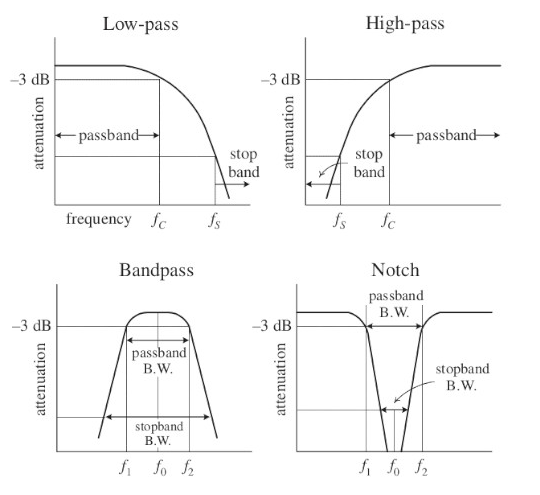

**Пример наложения полосо-заграждающего фильтра Баттерворта на трехкомпонентный сигнал:**

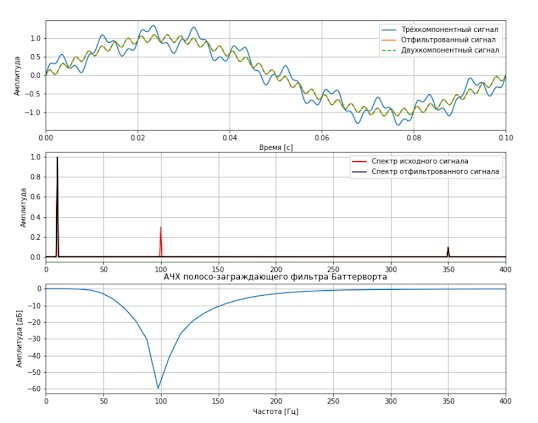

<font color='red'>Если у вас стоит задача по выделению сигнала или уменьшению шума, не стоит сразу бросаться и делать  скользящее среднее на этот сигнал. Есть фильтры, которые более эффективны. обладают хорошими характеристиками и в применении не сложнее. </font>

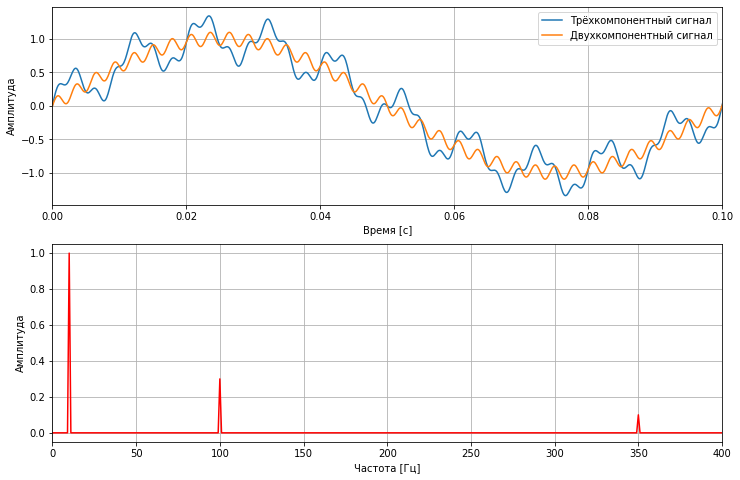

In [ ]:
w1 = 10  ## частота первого синуса
w2 = 100  ## частота второго синуса
w3 = 350
a1 = 1    ## амплитуда первого синуса
a2 = 0.3  ## амплитуда второго синуса
a3 = 0.1
Fs = 10000  ## частота дискретизации
Ts = 1.0/Fs ## интервал времени между соседними точками

df = pd.DataFrame()
## ось времени
df['t'] = np.arange(0, 1, Ts)
## cигнал из трёх компонент
df['y'] = a1*np.sin(2*np.pi*w1*df.t) + a2*np.sin(2*np.pi*w2*df.t) + a3*np.sin(2*np.pi*w3*df.t)

## желаемый сигнал (из первой и третьей компоненты)
df['y_desired'] = a1*np.sin(2*np.pi*w1*df.t) + a3*np.sin(2*np.pi*w3*df.t)

N = len(df)
## создаём сетку частот
frq = np.fft.fftfreq(N, Ts)
## нас интересуют только положительные частоты (отрицательные частоты симметричны) 
frq = frq[range(int(N/2))]

## делаем преобразование Фурье
Y = 2/N * np.fft.fft(df.y)
## нас интересуют только положительные частоты (отрицательные частоты симметричны) 
Y = Y[range(int(N/2))]

## визуализируем
fig, ax = plt.subplots(2, 1, figsize=(12, 8))
ax[0].plot(df.t, df.y)
ax[0].plot(df.t, df.y_desired)
ax[0].legend(['Трёхкомпонентный сигнал', 'Двухкомпонентный сигнал'])
ax[0].set_xlim([0, 0.1])
ax[0].set_xlabel('Время [c]')
ax[0].set_ylabel('Амплитуда')
ax[0].grid()

ax[1].plot(frq, abs(Y), 'r') 
ax[1].set_xlabel('Частота [Гц]')
ax[1].set_ylabel('Амплитуда')
ax[1].set_xlim([0, 400])
ax[1].grid()

data = df.copy()

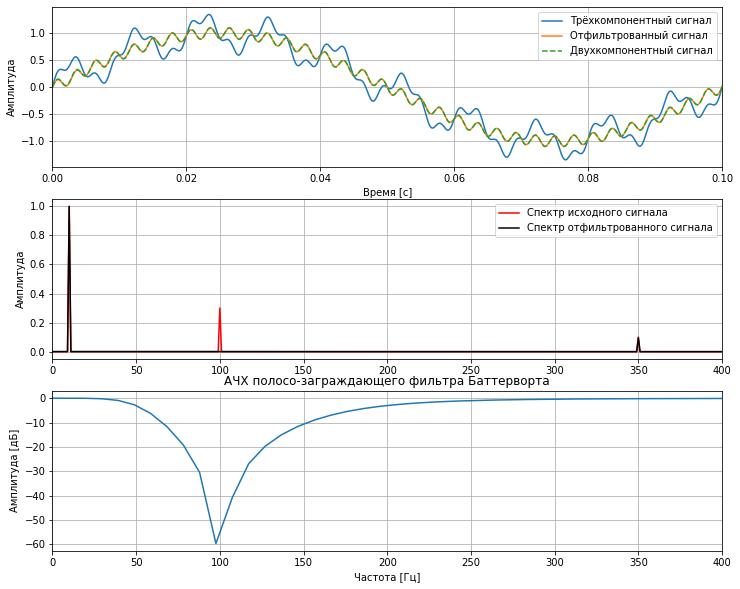

In [ ]:
## полосо-заграждающий фильтр
b, a = signal.butter(2, [50, 200], btype='bandstop', fs=Fs)
df['y_filt'] = signal.filtfilt(b, a, df.y)

## АЧХ фильтра
w, h = signal.freqz(b, a)
w = Fs/np.pi/2 * w ## переводим радианы в Герцы

N = len(df)
## создаём сетку частот
frq = np.fft.fftfreq(N, Ts)[range(int(N/2))]

## делаем преобразование Фурье
Y_filt = 2/N * np.fft.fft(df.y_filt)[range(int(N/2))]

## визуализируем
fig, ax = plt.subplots(3, 1, figsize=(12, 10))
ax[0].plot(df.t, df.y)
ax[0].plot(df.t, df.y_filt)
ax[0].plot(df.t, df.y_desired, '--')
ax[0].legend(['Трёхкомпонентный сигнал', 'Отфильтрованный сигнал', 'Двухкомпонентный сигнал'])
ax[0].set_xlim([0, 0.1])
ax[0].set_xlabel('Время [c]')
ax[0].set_ylabel('Амплитуда')
ax[0].grid()

ax[1].plot(frq, abs(Y), 'r')
ax[1].plot(frq, abs(Y_filt), c='k') 
ax[1].legend(['Спектр исходного сигнала', 'Спектр отфильтрованного сигнала'])
# ax[1].set_xlabel('Частота [Гц]')
ax[1].set_ylabel('Амплитуда')
ax[1].set_xlim([0, 400])
ax[1].grid()

ax[2].plot(w, 20 * np.log10(abs(h)))
ax[2].set_xlim([0, 400])
# ax[2].set_ylim([-35, 1])
ax[2].set_ylabel('Амплитуда [дБ]')
ax[2].set_xlabel('Частота [Гц]')
ax[2].set_title('АЧХ полосо-заграждающего фильтра Баттерворта')
ax[2].grid()

Пример непрерывного Фурье спектра

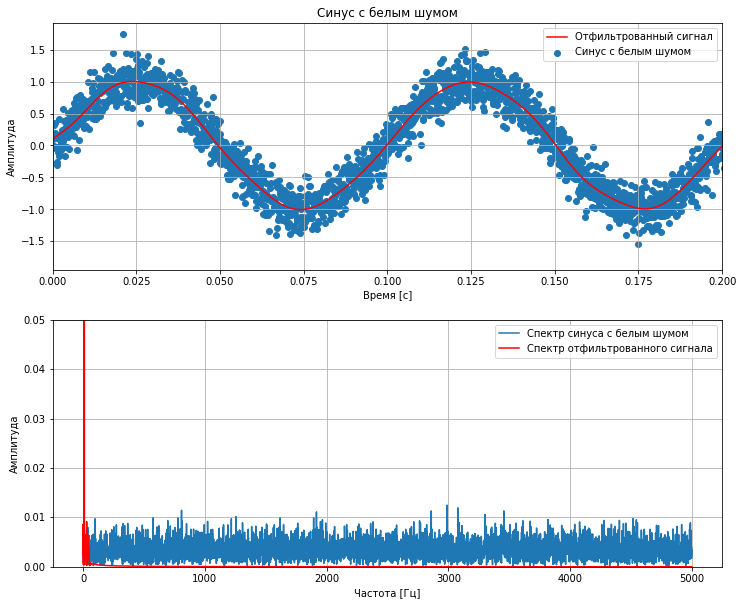

In [ ]:
w1 = 10  ## частота синуса
a1 = 1   ## амплитуда синуса
alpha = 0.2 ## амплитуда шума
Fs = 10000  ## частота дискретизации
Ts = 1.0/Fs ## интервал времени между соседними точками

df = pd.DataFrame()
## ось времени
df['t'] = np.arange(0, 1, Ts)
## cигнал из трёх компонент
df['y'] = a1*np.sin(2*np.pi*w1*df.t)

N = len(df) 
np.random.seed(42)
## добавляем шум в данные
df['y'] = df.y + alpha*np.random.randn(N)


## создаём фильтр Баттерворта
b, a = signal.butter(8, 0.01)
## применяем его
df['y_filt'] = signal.filtfilt(b, a, df.y, padlen=150)


## создаём сетку частот
frq = np.fft.fftfreq(N, Ts)[range(int(N/2))]
## делаем преобразование Фурье cигнала с шумом
Y = 2/N * np.fft.fft(df.y)[range(int(N/2))]
## делаем преобразование Фурье отфильтрованного cигнала
Y_filt = 2/N * np.fft.fft(df.y_filt)[range(int(N/2))]

## визуализируем ряд
f, ax = plt.subplots(2, 1, figsize=(12, 10))
ax[0].scatter(df.t, df.y)
ax[0].plot(df.t, df.y_filt, c='r')
ax[0].set_xlim([0, 0.2])
ax[0].set_ylabel('Амплитуда')
ax[0].set_xlabel('Время [c]')
ax[0].set_title('Cинус с белым шумом')
ax[0].legend(['Отфильтрованный сигнал', 'Cинус с белым шумом'])
ax[0].grid()

ax[1].plot(frq, abs(Y))
ax[1].plot(frq, abs(Y_filt), c='r')
ax[1].set_xlabel('Частота [Гц]')
ax[1].set_ylabel('Амплитуда')
# ax[1].set_xlim([0, 200])
ax[1].set_ylim([0, 0.05])
ax[1].legend([ 'Спектр синуса с белым шумом','Cпектр отфильтрованного сигнала'])
ax[1].grid()

### Задача

1. Cделайте преобразование Фурье от функции Гаусса. Укажите значение амплитуды преобразования Фурье на нулевой частоте. Результат округлите до одного знака после запятой.
2. Cоздайте низкочастотный фильтр Баттерворта 8-ого порядка с частотой отсечки на 250 Гц (используйте частоту дискретизации Fs в качестве одного из параметров функции signal.butter). Постройте его амплитудно-частотную характеристику (АЧХ) в Герцах (используйте функцию signal.freqz). Укажите значение ослабления сигнала в дБ на частоте в 254 Гц, округлённое до одной десятой. Для этого переведите радианы, полученные от функции signal.freqz в Герцы (см. код в скринкасте).
3. Примените полученный фильтр при помощи функции signal.filtfilt. Укажите среднее значение модуля отфильтрованной функции, округлённое до трёх знаков после запятой.
4. Создайте высокочастотный фильтр Чебышёва второго рода (signal.cheby2) четвёртого порядка с подавлением в 40 дБ на частоте 30 Гц. Укажите значение подавления сигнала на частоте 29 Гц (число округлено до целых) в дБ, округлённое до одной десятой.

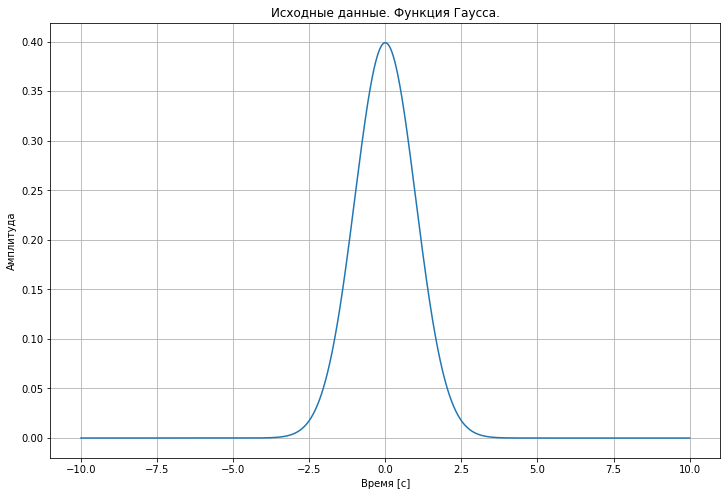

In [5]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import time, datetime
from scipy import signal

a1 = np.sqrt(1/2/np.pi) 
a2 = 1
Fs = 1000 
Ts = 1.0/Fs 
t0 = 0

df = pd.DataFrame()
df['t'] = np.arange(-10, 10, Ts)
## функция Гаусса
df['y'] = a1 * np.exp(-(df.t-t0)**2/2/a2)


fig, ax = plt.subplots(figsize=(12, 8))
ax.plot(df.t, df.y)
ax.set_xlabel('Время [c]')
ax.set_ylabel('Амплитуда')
ax.grid()
plt.title('Исходные данные. Функция Гаусса.')
plt.show()

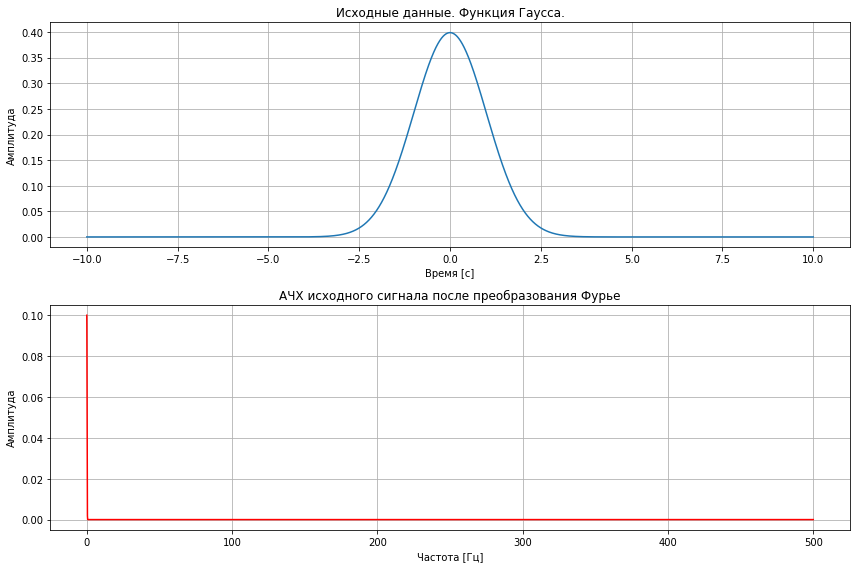

1.Значение амплитуды преобразования Фурье на нулевой частоте: 0.10000000000005543


In [6]:

N = len(df)
## создаём сетку частот
frq = np.fft.fftfreq(N, Ts)
## нас интересуют только положительные частоты (отрицательные частоты симметричны) 
frq = frq[range(int(N/2))]

## делаем преобразование Фурье
Y = 2/N * np.fft.fft(df.y)
## нас интересуют только положительные частоты (отрицательные частоты симметричны) 
Y = Y[range(int(N/2))]

## визуализируем
fig, ax = plt.subplots(2, 1, figsize=(12, 8))
ax[0].plot(df.t, df.y)
# ax[0].set_xlim([0, 0.1])
ax[0].set_xlabel('Время [c]')
ax[0].set_ylabel('Амплитуда')
ax[0].set_title('Исходные данные. Функция Гаусса.')
ax[0].grid()

ax[1].plot(frq, abs(Y), 'r') 
ax[1].set_xlabel('Частота [Гц]')
ax[1].set_ylabel('Амплитуда')
# ax[1].set_xlim([-200, 200])
ax[1].set_title('АЧХ исходного сигнала после преобразования Фурье')
ax[1].grid()
plt.tight_layout()
plt.show()
print('1.Значение амплитуды преобразования Фурье на нулевой частоте:',abs(Y)[0])

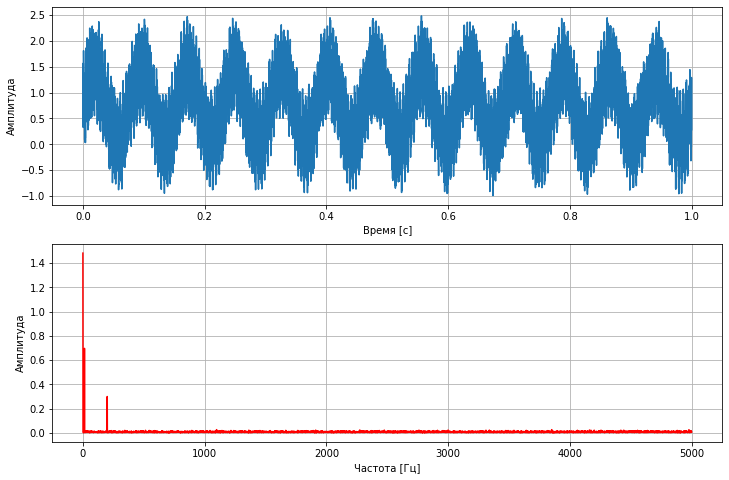

In [7]:
w1 = 13   ## частота первого синуса
w2 = 200  ## частота второго синуса
a1 = 0.7  ## амплитуда первого синуса
a2 = 0.3  ## амплитуда второго синуса
a3 = 1.5  ## амплитуда шума
Fs = 10000  ## частота дискретизации: 10 кГц
Ts = 1.0/Fs ## интервал времени между соседними точками

np.random.seed(42)

df = pd.DataFrame()
## ось времени
df['t'] = np.arange(0, 1, Ts)
## cигнал
df['y'] = a1*np.sin(2*np.pi*w1*df.t) + a2*np.sin(2*np.pi*w2*df.t) + a3*np.random.random(len(df))

N = len(df)
## создаём сетку частот
frq = np.fft.fftfreq(N, Ts)
## нас интересуют только положительные частоты (отрицательные частоты симметричны) 
frq = frq[range(int(N/2))]

## делаем преобразование Фурье
Y = 2/N * np.fft.fft(df.y)
## нас интересуют только положительные частоты (отрицательные частоты симметричны) 
Y = Y[range(int(N/2))]

## визуализируем
fig, ax = plt.subplots(2, 1, figsize=(12, 8))
ax[0].plot(df.t, df.y)
# ax[0].set_xlim([0, 0.1])
ax[0].set_xlabel('Время [c]')
ax[0].set_ylabel('Амплитуда')
ax[0].grid()

ax[1].plot(frq, abs(Y), 'r') 
ax[1].set_xlabel('Частота [Гц]')
ax[1].set_ylabel('Амплитуда')
# ax[1].set_xlim([0, 250])
ax[1].grid()

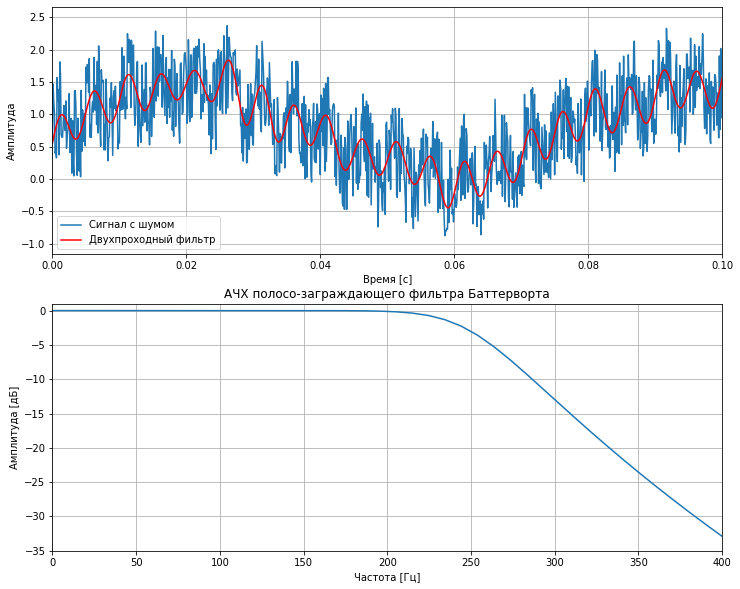

2.Значение ослабления сигнала в дБ на частоте в 254 Гц: [-3.6]
3: Cреднее значение модуля отфильтрованной функции 0.767


In [8]:
## создаём фильтр ("фильтр Баттерворта")
b, a = signal.butter(8, 0.05)
## применяем его
df['y_filt_double'] = signal.filtfilt(b, a, df.y, padlen=150)

## визуализируем
fig, ax = plt.subplots(2, 1, figsize=(12, 10))
ax[0].plot(df.t, df.y)
ax[0].plot(df.t, df.y_filt_double,'r')
# ax[0].plot(df.t, df.y_desired, '--')
ax[0].legend(['Сигнал с шумом', 'Двуxпроходный фильтр'])
ax[0].set_xlim([0, 0.1])
ax[0].set_xlabel('Время [c]')
ax[0].set_ylabel('Амплитуда')
ax[0].grid()

## АЧХ фильтра
w, h = signal.freqz(b, a)
w = Fs/np.pi/2 * w ## переводим радианы в Герцы

ax[1].plot(w, 20 * np.log10(abs(h)))
ax[1].set_xlim([0, 400])
ax[1].set_ylim([-35, 1])
ax[1].set_ylabel('Амплитуда [дБ]')
ax[1].set_xlabel('Частота [Гц]')
ax[1].set_title('АЧХ полосо-заграждающего фильтра Баттерворта')
ax[1].grid()
plt.show()

print('2.Значение ослабления сигнала в дБ на частоте в 254 Гц:',np.round(20 * np.log10(abs(h[(w>253)&(w<255)])),1))
print('3: Cреднее значение модуля отфильтрованной функции',round(abs(df['y_filt_double']).mean(),3))

2.Значение ослабления сигнала в дБ на частоте в 29 Гц: [-37.]
3: Cреднее значение модуля отфильтрованной функции 0.737


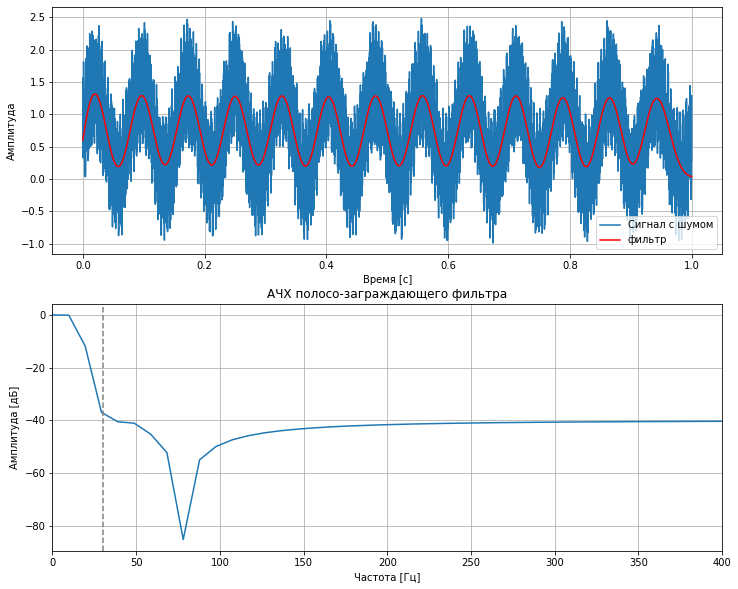

2.Значение ослабления сигнала в дБ на частоте в 29 Гц: [-37.]
3: Cреднее значение модуля отфильтрованной функции 0.737


In [9]:
## создаём фильтр
b, a = signal.cheby2(4, 40, 30/10000*2)
## АЧХ фильтра
w, h = signal.freqz(b, a)
w = Fs/np.pi/2 * w ## переводим радианы в Герцы
## применяем его
df['y_filt_double_'] = signal.filtfilt(b, a, df.y, padlen=150)
print('2.Значение ослабления сигнала в дБ на частоте в 29 Гц:',np.round(20 * np.log10(abs(h[(w>28)&(w<30)])),1))
print('3: Cреднее значение модуля отфильтрованной функции',round(abs(df['y_filt_double_']).mean(),3))


## визуализируем
fig, ax = plt.subplots(2, 1, figsize=(12, 10))
ax[0].plot(df.t, df.y)
ax[0].plot(df.t, df.y_filt_double_,'r')
ax[0].legend(['Сигнал с шумом', 'фильтр'])
# ax[0].set_xlim([0, 0.1])
ax[0].set_xlabel('Время [c]')
ax[0].set_ylabel('Амплитуда')
ax[0].grid()



ax[1].plot(w, 20 * np.log10(abs(h)))
ax[1].set_xlim([0, 400])
ax[1].axvline(x=30,ls='--',c='grey')

# ax[1].set_ylim([-35, 1])
ax[1].set_ylabel('Амплитуда [дБ]')
ax[1].set_xlabel('Частота [Гц]')
ax[1].set_title('АЧХ полосо-заграждающего фильтра')
ax[1].grid()
plt.show()

print('2.Значение ослабления сигнала в дБ на частоте в 29 Гц:',np.round(20 * np.log10(abs(h[(w>28)&(w<30)])),1))
print('3: Cреднее значение модуля отфильтрованной функции',round(abs(df['y_filt_double_']).mean(),3))

## Выделение признаков. TFresh
http://tsfresh.readthedocs.io/en/latest/

Алгоритмы машинного обучения не работают напрямую с временными рядами. 

Например,  у нас есть временной ряд, как на одной из этих картинок. Каждый ряд состоит из 300 точек. То есть каждая точка являлась бы отдельной фичей, в результате мы получили бы более чем 300 000 фич на 1 временной ряд, что вычислительно очень сложно и не оптимально. 

Поэтому обычно из временных рядов выделяются характерные признаки («фичи»). 

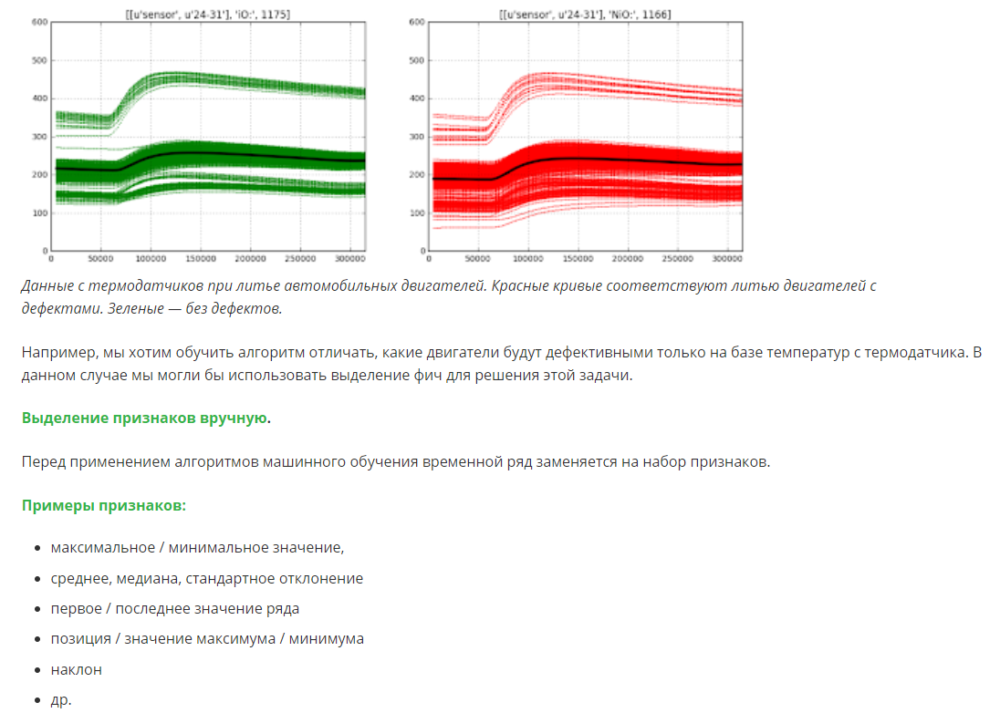

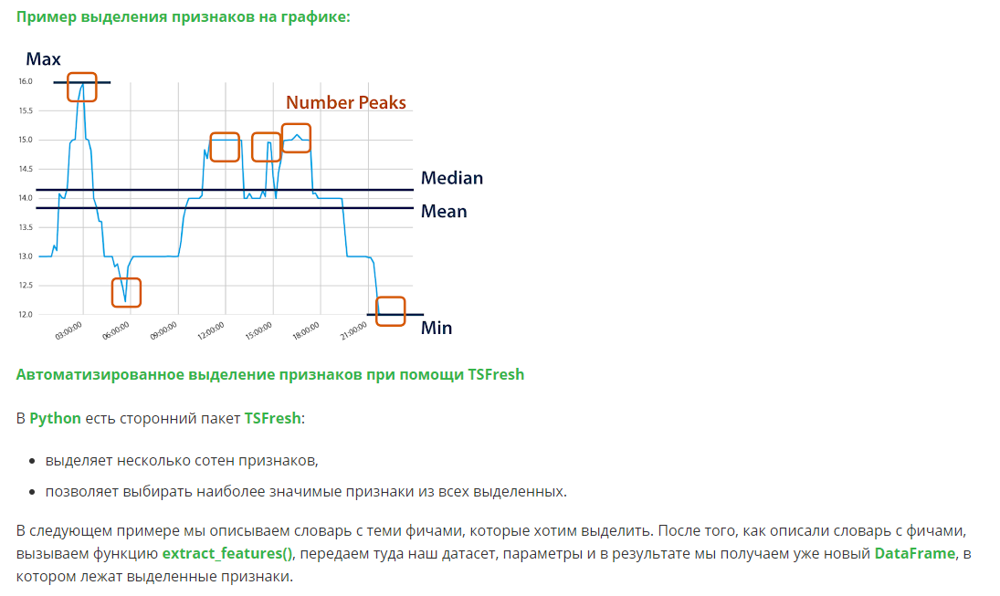

In [ ]:
!pip install tsfresh

     |████████████████████████████████| 92kB 4.2MB/s 
     |████████████████████████████████| 675kB 8.9MB/s 
     |████████████████████████████████| 102kB 9.5MB/s 
     |████████████████████████████████| 102kB 8.6MB/s 
  Created wheel for contextvars: filename=contextvars-2.4-cp36-none-any.whl size=7667 sha256=b98783aec274e3ffb687119020eb6a858de1b3308c4e38179db130e7a941343e
  Stored in directory: /root/.cache/pip/wheels/a5/7d/68/1ebae2668bda2228686e3c1cf16f2c2384cea6e9334ad5f6de
  Created wheel for locket: filename=locket-0.2.0-cp36-none-any.whl size=4042 sha256=e8cd6c2fbb4b6b248bf90502d1f03d7d886645ad44026e3cb313379231a28a6a
  Stored in directory: /root/.cache/pip/wheels/26/1e/e8/4fa236ec931b1a0cdd61578e20d4934d7bf188858723b84698
Successfully built contextvars locket
ERROR: tensorflow-probability 0.11.0 has requirement cloudpickle==1.3, but you'll have cloudpickle 1.6.0 which is incompatible.
ERROR: distributed 2020.12.0 has requirement dask>=2020.12.0, but you'll have dask 2.12.0 whi

In [ ]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# выделение признаков при помощи TSFresh
from tsfresh import extract_features, extract_relevant_features, select_features
from tsfresh.utilities.dataframe_functions import impute
from tsfresh.feature_extraction import ComprehensiveFCParameters, EfficientFCParameters, MinimalFCParameters

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


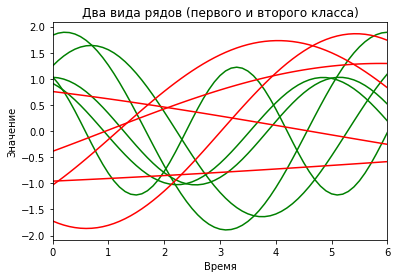

data.shape = (122000, 4)
data.id.nunique() = 2000


,t,y,class,id
0,0.0,3.245872,1,0
1,0.1,3.348260,1,0
2,0.2,3.436487,1,0


In [ ]:
N = 1000 ## количество семплов каждого класса
Nvis = 5 ## сколько семплов будем визуализировать
timePoints = 61  ## количество элементов в каждом из рядов

df = pd.DataFrame()
data = pd.DataFrame()
t = np.linspace(0, 6, timePoints) 

random.seed(42)

## генерируем семплы первого класса
for i in range(N):
    A = 1 + random.random()        ## амплитуда
    w = 1 + random.random()        ## частота
    ph = np.pi * random.random()   ## фаза
    
    
    df['t']  = t                   ## ось времени
    df['y']  = A*np.sin(t*w + ph)  ## значения временного ряда
    df['class'] = 1                ## класс временного ряда 
    df['id'] = i                   ## номер временного ряда
    
    data = data.append(df)         ## добавляем семпл в общий дейтафрейм
    if i < Nvis:                   ## визуализируем первые Nvis-штук
        plt.plot(df.t, df.y, color='g') 
    
## генерируем семплы второго класса    
for i in range(N, 2*N):
    A = 1 + random.random()          ## амплитуда
    w = 0 + random.random()          ## частота
    ph = 2*np.pi * random.random()   ## фаза
    
    df['t']  = t                     ## ось времени
    df['y']  = A*np.sin(t*w + ph)    ## значения временного ряда
    df['class'] = 0                  ## класс временного ряда 
    df['id'] = i                     ## номер временного ряда
    
    data = data.append(df)           ## добавляем семпл в общий дейтафрейм
    if i < Nvis+N:                   ## визуализируем первые Nvis-штук
        plt.plot(df.t, df.y, color='r') 
    
## cдвигаем все значения вверх, чтобы все значения были положительными    
data['y'] = data.y + np.abs(data.y.min())
    
plt.xlabel("Время")
plt.ylabel("Значение")
plt.title('Два вида рядов (первого и второго класса)')
plt.xlim([t[0], t[-1]])
plt.show()

print('data.shape =', data.shape)
print('data.id.nunique() =', data.id.nunique())
data.head(3)

In [ ]:
def featuresTSFresh(data):    

    ## список фич (см. документацию по TSFresh: https://media.readthedocs.org/pdf/tsfresh/latest/tsfresh.pdf)
    extraction_settings = \
    {
        ## признак: параметр
        "maximum": None,
        "mean": None,
        "minimum": None,
        "median": None,
        "standard_deviation": None,
        "binned_entropy": [{"max_bins" : 10}],
        "count_above_mean": None,
        "count_below_mean": None,
        "first_location_of_maximum": None,
        "first_location_of_minimum": None,
        "mean_change": None,
        "sum_values": None,
        "kurtosis": None,
        "skewness": None,
        "abs_energy": None        
    }

    ## извлечение фич из данных    
    featuresDF = extract_features(
        data, 
        column_id='id',  ## номер временного ряда
        column_sort='t', ## ось времени
        default_fc_parameters=extraction_settings, ## список фич, которые хотим извлечь
        impute_function=impute                     ## заменить все inf и NaN
    )
    
    ## вытаскиваем колонку id из индекса 
    featuresDF = featuresDF.reset_index()

    return featuresDF

## убираем колонку class из данных (мы не хотим из неё извлекать фичи)
features = featuresTSFresh(data.drop('class', axis=1))

## помечаем ряды (добавляем обратно первый и второй класс)
features['label'] = 0
features['label'].iloc[N:] = 1

print('data.shape =', data.shape)
print('features.shape =', features.shape)
features.head(3)

Feature Extraction: 100%|██████████| 5/5 [00:02<00:00,  1.86it/s]

data.shape = (122000, 4)
features.shape = (2000, 17)



/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


,index,y__maximum,y__mean,y__minimum,y__median,y__standard_deviation,y__binned_entropy__max_bins_10,y__count_above_mean,y__count_below_mean,y__first_location_of_maximum,y__first_location_of_minimum,y__mean_change,y__sum_values,y__kurtosis,y__skewness,y__abs_energy,label
0,0,3.638476,1.993396,0.361503,2.021114,1.159167,2.177507,31.0,30.0,0.114754,0.622951,-0.002539,121.597163,-1.522487,0.010053,324.355057,0
1,1,3.222351,1.831576,0.776047,1.756307,0.828757,2.185494,27.0,34.0,0.540984,0.836066,-0.017766,111.726131,-1.365224,0.291575,246.532037,0
2,2,3.891279,2.096981,0.107249,2.144667,1.367380,2.146856,31.0,30.0,0.983607,0.508197,0.000943,127.915835,-1.548907,-0.083391,382.290408,0


trainSet.shape = (1200, 17)
testSet.shape  = (800, 17)

Value counts train:
 1    603
0    597
Name: label, dtype: int64

Value counts test:
 0    403
1    397
Name: label, dtype: int64


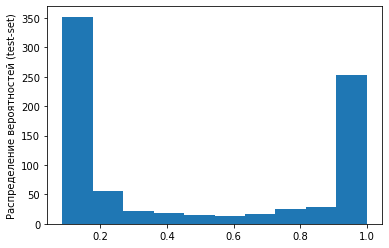

                          features  importances
12                     y__kurtosis     0.534560
9     y__first_location_of_minimum     0.276429
5   y__binned_entropy__max_bins_10     0.095582
4            y__standard_deviation     0.034913
8     y__first_location_of_maximum     0.026620
10                  y__mean_change     0.008383
1                          y__mean     0.007291
11                   y__sum_values     0.006439
3                        y__median     0.004434
13                     y__skewness     0.002465
14                   y__abs_energy     0.002340
0                       y__maximum     0.000257
7              y__count_below_mean     0.000155
2                       y__minimum     0.000131
6              y__count_above_mean     0.000000

   Pos  Neg
0  394    9
1   63  334

AUC = 0.960  Точность = 0.910



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


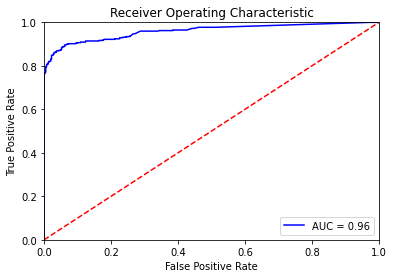

In [ ]:
## разбиваем выделенные фичи на тренировочный и тестовый наборы 
trainSet, testSet = train_test_split(features, test_size=0.4, random_state=42) 

## выводим статистику по нашим наборам
print('trainSet.shape =', trainSet.shape)
print('testSet.shape  =', testSet.shape)
print()
print('Value counts train:\n', trainSet.label.value_counts())
print()
print('Value counts test:\n', testSet.label.value_counts())

## лист фич
featureList = trainSet.drop(['index', 'label'], axis=1).columns

## параметры классификатора
params = {'n_estimators': 100, 'max_depth': 4, 'min_samples_split': 2, 'max_features' : 1.0, 'class_weight' : 'balanced',
         'random_state': 42}

## обучаем классификатор
clf = RandomForestClassifier(**params).fit(trainSet[featureList], trainSet['label'])

## делаем предсказание на тестовом наборе
y_pred = clf.predict(testSet[featureList])
y_pred_proba = clf.predict_proba(testSet[featureList])[:, 1]  ## вероятности

## визуализируем вероятности для предсказаний
import matplotlib.pyplot as plt
plt.hist(y_pred_proba)
plt.ylabel('Распределение вероятностей (test-set)')
plt.show()



from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from math import isnan

## создадим для удобства дейтафрейм с результатами
res = testSet
res['pred'] = y_pred 
res['pred_proba'] = y_pred_proba

## получаем из классификатора важность фич и отображаем их
ftmprt = pd.DataFrame()
ftmprt['features'] = featureList
ftmprt['importances'] = clf.feature_importances_
ftmprt = ftmprt.sort_values('importances', ascending=False)
print(ftmprt.head(20))
print()
proba = res.pred_proba

## считаем матрицу ошибок
CM = confusion_matrix(res['label'], res['pred'])
CM_DF = pd.DataFrame(data=CM, columns = ['Pos', 'Neg'])
print(CM_DF)

# ROC-AUC 
FPR, TPR, thresholds = roc_curve(res['label'], res['pred_proba'])
roc_auc = auc(FPR, TPR)
acc = res[res['pred'] == res['label']].shape[0] / res.shape[0] ## точность
print(f"\nAUC = {roc_auc:.3f}  Точность = {acc:.3f}\n")

# ROC-кривая
plt.title('Receiver Operating Characteristic')
plt.plot(FPR, TPR, 'b', label=f'AUC = {roc_auc:.2f}')
plt.legend(loc='lower right')
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

### Задача

Посчитайте максимальное, минимальное, среднее и медианное значение для каждого временного ряда. Хинт: используйте функцию pandas.DataFrame.groupby(). Укажите эти значения округлённые до второго знака после запятой для временного ряда с id = 3.

1. Укажите максимальное, минимальное, среднее и медианное значения.
2. Создайте дейтафрейм features с посчитанными фичами (минимальное, среднее и медианное значение) для каждого из рядов, содержащий, помимо фич, колонки:
'id', 'label'.
Запустите алгоритм в следующей ячейке. Укажите количество false negatives.
3. Посчитайте те же четыре фичи (max, min, mean, median), а также "count_below_mean" при помощи пакета TSFresh, результат запишите в дейтафрейм features. Укажите значение count_below_mean для ряда с id == 4. Ответ округлите до целого числа.

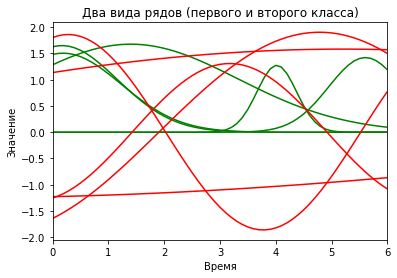

data.shape = (12200, 4)
data.id.nunique() = 200


,t,y,label,id
0,0.0,1.957849,1,0
1,0.1,1.957849,1,0
2,0.2,1.957849,1,0


In [ ]:
N = 100 ## количество семплов каждого класса
Nvis = 5 ## сколько семплов будем визуализировать
timePoints = 61  ## количество элементов в каждом из рядов

df = pd.DataFrame()
data = pd.DataFrame()
t = np.linspace(0, 6, timePoints) 

random.seed(42)

## генерируем семплы первого класса
for i in range(N):
    t0 = 2*np.pi*random.random()
    a1 = 5*random.random()
    A = 1 + random.random()        
    
    df['t']  = t                   ## ось времени
    df['y']  = A*np.exp(-(df.t-t0)**2/2/a1)  ## значения временного ряда
    df['label'] = 1                ## класс временного ряда 
    df['id'] = i                   ## номер временного ряда
    
    data = data.append(df)         ## добавляем семпл в общий дейтафрейм
    if i < Nvis:                   ## визуализируем первые Nvis-штук
        plt.plot(df.t, df.y, color='g') 
    
## генерируем семплы второго класса    
for i in range(N, 2*N):
    A = 1 + random.random()          ## амплитуда
    w = 0 + random.random()          ## частота
    ph = 2*np.pi * random.random()   ## фаза
    
    df['t']  = t                     ## ось времени
    df['y']  = A*np.sin(t*w + ph)    ## значения временного ряда
    df['label'] = 0                  ## класс временного ряда 
    df['id'] = i                     ## номер временного ряда
    
    data = data.append(df)           ## добавляем семпл в общий дейтафрейм
    if i < Nvis+N:                   ## визуализируем первые Nvis-штук
        plt.plot(df.t, df.y, color='r') 
    
## cдвигаем все значения вверх, чтобы все значения были положительными    
data['y'] = data.y + np.abs(data.y.min())
    
plt.xlabel("Время")
plt.ylabel("Значение")
plt.title('Два вида рядов (первого и второго класса)')
plt.xlim([t[0], t[-1]])
plt.show()

print('data.shape =', data.shape)
print('data.id.nunique() =', data.id.nunique())
data.head(3)

In [ ]:
features = data.groupby('id').agg({'y':['max','min','mean','median'],'label':'first'})
print('1:',round(features.iloc[3],2))
features = features.reset_index()
features.columns = ['id','max','min','mean','median','label']
features

1: y      max       3.46
       min       1.96
       mean      2.34
       median    2.00
label  first     1.00
Name: 3, dtype: float64


,id,max,min,mean,median,label
0,0,3.231294,1.957849,2.143130,1.957977,1
1,1,3.634548,2.052910,2.972939,3.143508,1
2,2,3.379718,1.957849,2.246776,1.958426,1
3,3,3.463092,1.957850,2.339297,1.998222,1
4,4,3.606816,1.957850,2.354036,1.986966,1
...,...,...,...,...,...,...
195,195,2.372536,0.714004,1.203662,1.008454,0
196,196,1.003554,0.847096,0.922809,0.921486,0
197,197,1.960760,0.828983,1.305666,1.257858,0
198,198,3.298036,0.618728,2.110081,2.270264,0


trainSet.shape = (120, 6)
testSet.shape  = (80, 6)

Value counts train:
 1    60
0    60
Name: label, dtype: int64

Value counts test:
 1    40
0    40
Name: label, dtype: int64


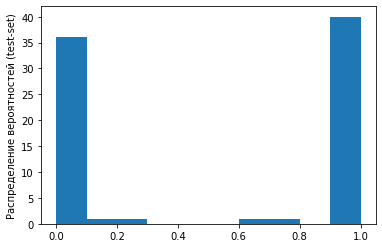

  features  importances
1      min     0.979876
0      max     0.019648
2     mean     0.000476
3   median     0.000000

   Neg  Pos
0   38    2
1    0   40
fn: 0

AUC = 1.000  Точность = 0.975



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


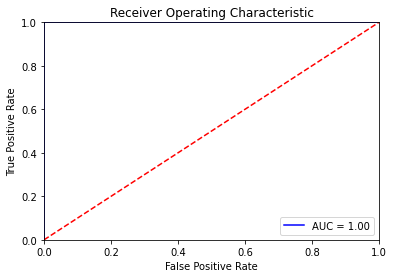

In [ ]:
trainSet, testSet = train_test_split(features, test_size=0.4, random_state=42) 

## выводим статистику по нашим наборам
print('trainSet.shape =', trainSet.shape)
print('testSet.shape  =', testSet.shape)
print()
print('Value counts train:\n', trainSet.label.value_counts())
print()
print('Value counts test:\n', testSet.label.value_counts())

## лист фич
featureList = trainSet.drop(['id', 'label'], axis=1).columns

## параметры классификатора
params = {'n_estimators': 100, 'max_depth': 4, 'min_samples_split': 2, 'max_features' : 1.0, 'class_weight' : 'balanced',
         'random_state': 42}

## обучаем классификатор
clf = RandomForestClassifier(**params).fit(trainSet[featureList], trainSet['label'])

## делаем предсказание на тестовом наборе
y_pred = clf.predict(testSet[featureList])
y_pred_proba = clf.predict_proba(testSet[featureList])[:, 1]  ## вероятности

## визуализируем вероятности для предсказаний
plt.hist(y_pred_proba)
plt.ylabel('Распределение вероятностей (test-set)')
plt.show()
## создадим для удобства дейтафрейм с результатами
res = testSet
res['pred'] = y_pred 
res['pred_proba'] = y_pred_proba

## получаем из классификатора важность фич и отображаем их
ftmprt = pd.DataFrame()
ftmprt['features'] = featureList
ftmprt['importances'] = clf.feature_importances_
ftmprt = ftmprt.sort_values('importances', ascending=
False)
print(ftmprt.head(20))
print()
proba = res.pred_proba

## считаем матрицу ошибок
CM = confusion_matrix(res['label'], res['pred'])
CM_DF = pd.DataFrame(data=CM, columns = ['Neg', 'Pos'])
print(CM_DF)
tn, fp, fn, tp = confusion_matrix(res['label'], res['pred']).ravel()
print('fn:',fn )

# ROC-AUC 
FPR, TPR, thresholds = roc_curve(res['label'], res['pred_proba'])
roc_auc = auc(FPR, TPR)
acc = res[res['pred'] == res['label']].shape[0] / res.shape[0] ## точность
print(f"\nAUC = {roc_auc:.3f}  Точность = {acc:.3f}\n")

# ROC-кривая
plt.title('Receiver Operating Characteristic')
plt.plot(FPR, TPR, 'b', label=f'AUC = {roc_auc:.2f}')
plt.legend(loc='lower right')
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
def featuresTSFresh(data):    

    ## список фич (см. документацию по TSFresh: https://media.readthedocs.org/pdf/tsfresh/latest/tsfresh.pdf)
    extraction_settings = \
    {
        ## признак: параметр
        "maximum": None,
        "mean": None,
        "minimum": None,
        "median": None,
        # "standard_deviation": None,
        # "binned_entropy": [{"max_bins" : 10}],
        # "count_above_mean": None,
        "count_below_mean": None,
        # "first_location_of_maximum": None,
        # "first_location_of_minimum": None,
        # "mean_change": None,
        # "sum_values": None,
        # "kurtosis": None,
        # "skewness": None,
        # "abs_energy": None        
    }

    ## извлечение фич из данных    
    featuresDF = extract_features(
        data, 
        column_id='id',  ## номер временного ряда
        column_sort='t', ## ось времени
        default_fc_parameters=extraction_settings, ## список фич, которые хотим извлечь
        impute_function=impute                     ## заменить все inf и NaN
    )
    
    ## вытаскиваем колонку id из индекса 
    featuresDF = featuresDF.reset_index()

    return featuresDF

## убираем колонку class из данных (мы не хотим из неё извлекать фичи)
features = featuresTSFresh(data.drop('label', axis=1))

## помечаем ряды (добавляем обратно первый и второй класс)
features['label'] = 0
features['label'].iloc[N:] = 1

print('data.shape =', data.shape)
print('features.shape =', features.shape)
print('3:',features.loc[4,'y__count_below_mean'])

Feature Extraction: 100%|██████████| 5/5 [00:00<00:00, 11.89it/s]

data.shape = (12200, 4)
features.shape = (200, 7)
3: 42.0



/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


## Выделение признаков (Разложение) NNMF


**Non-negative Matrix Factorization — NNMF**

Для чего нам нужны разные методы выделения признаков? Хотим получить набор признаков, который является минимальным и при этом наиболее эффективным.

**NNMF** — более энергозатратный, чем **TSFresh**, но при этом получает минимальный набор признаков.

**Как работает NNMF?**

Для начала нам нужна положительно определённая матрица Х: xij ≥ 0
Матрица Х представляет собой набор временных рядов.

При помощи алгоритма факторизации раскладываем матрицу на произведение двух других матриц:
**X = WH**

**W** — выделенные фичи.
**H** — набор базисных функций, по которым раскладывается исходная матрица.

Но нас интересует упрощенное разложение, то есть мы задаем, насколько точным мы хотим сделать разложение. Если нужно наиболее эффективное количеств фич или наиболее ёмкие фичи, то можно ограничить матрицу каким-то небольшим числом, например, 3, 5 или 10 фич. Таким образом разложение из точного становится приблизительным.

**X ~ Wчастичная Hчастичная**

Для применения этого метода нужно разбить данные **на тренировочный и тестовый сет.**

**Тренировочные данные: **
алгоритм находит матрицу H
Xtrain ~ Wtrain H 

**Тестовые данные: **
алгоритм раскладывает X по H
Xtest ~ Wtest H

Wtest является набором выделенных признаков.

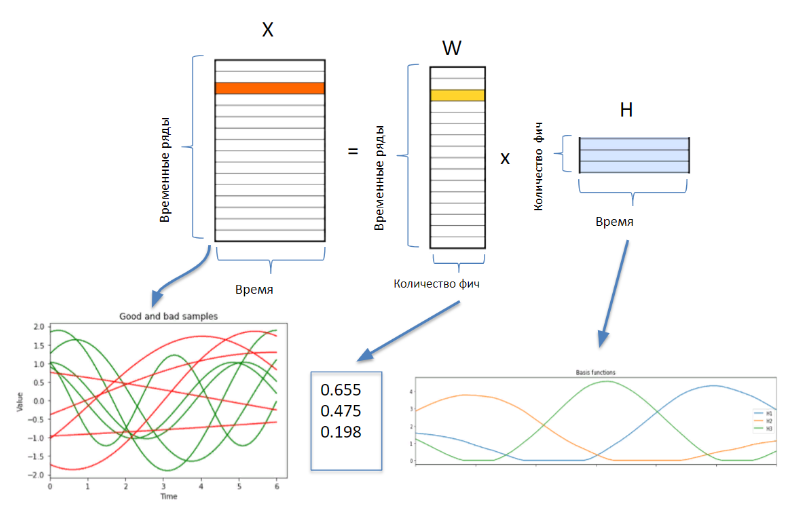

### Задача

1. Поверните дейтафрейм так, чтобы единицы времени являлись названием колонок. Используйте для этого функцию pivot. Укажите значение колонки "0.8" в первой строке.
2. Сделайте разбиение на тренировочный и тестовый датасеты при помощи train_test_split c параметрами test_size=0.4, random_state=42. После сделайте разложение при помощи NMF с параметрами: n_components=5, init='nndsvd', random_state=42, tol=0.001, max_iter=5000, solver='cd'. Натенируйте модель, получите функции разложения Н и коэффициенты разложения W_train, W_test для тренировочного и тестового сетов. Не забудьте убрать колонку label перед тренировкой. Укажите значение H[0][0] с точностью до второго знака после запятой.
3. Реконструируйте нулевой элемент из тренировочного сета, используя базовые функции и коэффициенты разложения. Для этого скалярно перемножьте их. Укажите 55-ый элемент реконструированной функции, округлив его до второго знака после запятой.

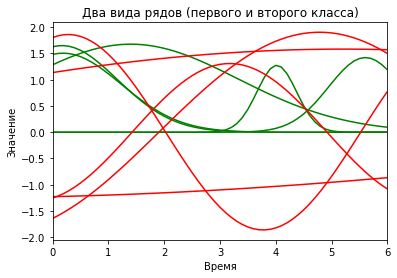

data.shape = (12200, 4)
data.id.nunique() = 200


,t,y,label,id
0,0.0,1.957849,1,0
1,0.1,1.957849,1,0
2,0.2,1.957849,1,0


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

from sklearn.decomposition import NMF

from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from math import isnan

N = 100 ## количество семплов каждого класса
Nvis = 5 ## сколько семплов будем визуализировать
timePoints = 61  ## количество элементов в каждом из рядов

df = pd.DataFrame()
data = pd.DataFrame()
t = np.linspace(0, 6, timePoints) 

random.seed(42)

## генерируем семплы первого класса
for i in range(N):
    t0 = 2*np.pi*random.random()
    a1 = 5*random.random()
    A = 1 + random.random()        
    
    df['t']  = t                   ## ось времени
    df['y']  = A*np.exp(-(df.t-t0)**2/2/a1)  ## значения временного ряда
    df['label'] = 1                ## класс временного ряда 
    df['id'] = i                   ## номер временного ряда
    
    data = data.append(df)         ## добавляем семпл в общий дейтафрейм
    if i < Nvis:                   ## визуализируем первые Nvis-штук
        plt.plot(df.t, df.y, color='g') 
    
## генерируем семплы второго класса    
for i in range(N, 2*N):
    A = 1 + random.random()          ## амплитуда
    w = 0 + random.random()          ## частота
    ph = 2*np.pi * random.random()   ## фаза
    
    df['t']  = t                     ## ось времени
    df['y']  = A*np.sin(t*w + ph)    ## значения временного ряда
    df['label'] = 0                  ## класс временного ряда 
    df['id'] = i                     ## номер временного ряда
    
    data = data.append(df)           ## добавляем семпл в общий дейтафрейм
    if i < Nvis+N:                   ## визуализируем первые Nvis-штук
        plt.plot(df.t, df.y, color='r') 
    
## cдвигаем все значения вверх, чтобы все значения были положительными    
data['y'] = data.y + np.abs(data.y.min())
    
plt.xlabel("Время")
plt.ylabel("Значение")
plt.title('Два вида рядов (первого и второго класса)')
plt.xlim([t[0], t[-1]])
plt.show()

print('data.shape =', data.shape)
print('data.id.nunique() =', data.id.nunique())
data.head(3)

In [ ]:
dataPivoted = data.pivot(index='id', columns='t', values='y')
dataPivoted = dataPivoted.reset_index(drop=True)
dataPivoted['label'] = 0
dataPivoted['label'].iloc[N:] = 1
print('dataPivoted.shape =', dataPivoted.shape)
print('1:',dataPivoted.loc[0,0.8])
dataPivoted.head(3)

dataPivoted.shape = (200, 62)
1: 1.9578494756366658


/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


t,0.0,0.1,0.2,0.30000000000000004,0.4,0.5,0.6000000000000001,0.7000000000000001,0.8,0.9,1.0,1.1,1.2000000000000002,1.3,1.4000000000000001,1.5,1.6,1.7000000000000002,1.8,1.9000000000000001,2.0,2.1,2.2,2.3000000000000003,2.4000000000000004,2.5,2.6,2.7,2.8000000000000003,2.9000000000000004,3.0,3.1,3.2,3.3000000000000003,3.4000000000000004,3.5,3.6,3.7,3.8000000000000003,3.9000000000000004,4.0,4.1000000000000005,4.2,4.3,4.4,4.5,4.6000000000000005,4.7,4.800000000000001,4.9,5.0,5.1000000000000005,5.2,5.300000000000001,5.4,5.5,5.6000000000000005,5.7,5.800000000000001,5.9,6.0,label
0,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957850,1.957850,1.957852,1.957859,1.957886,1.957977,1.958262,1.959082,1.961246,1.966490,1.978140,2.001839,2.045886,2.120499,2.235254,2.394613,2.592670,2.809626,3.012898,3.164247,3.231294,3.198761,3.074129,2.884843,2.668493,2.460768,2.286410,2.156004,2.068172,2.014551,1.984752,1.969633,1.962614,1.959628,1.958462,1.958044,1.957907,1.957865,1.957853,1.957850,1.957850,0
1,3.241556,3.289581,3.335656,3.379460,3.420678,3.459009,3.494166,3.525883,3.553915,3.578042,3.598073,3.613848,3.625241,3.632160,3.634548,3.632385,3.625690,3.614516,3.598955,3.579131,3.555202,3.527359,3.495819,3.460826,3.422645,3.381563,3.337880,3.291910,3.243974,3.194397,3.143508,3.091629,3.039081,2.986171,2.933198,2.880445,2.828179,2.776647,2.726077,2.676676,2.628627,2.582093,2.537211,2.494098,2.452848,2.413531,2.376199,2.340884,2.307600,2.276341,2.247090,2.219813,2.194464,2.170989,2.149323,2.129392,2.111119,2.094421,2.079213,2.065405,2.052910,0
2,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957849,1.957850,1.957850,1.957850,1.957850,1.957851,1.957852,1.957854,1.957860,1.957871,1.957893,1.957936,1.958016,1.958163,1.958426,1.958888,1.959677,1.960991,1.963128,1.966516,1.971757,1.979659,1.991272,2.007906,2.031111,2.062636,2.104319,2.157925,2.224936,2.306282,2.402066,2.511301,2.631716,2.759671,2.890224,3.017377,3.134488,3.234827,3.312206,3.361605,3.379718,3.365310,3.319365,3.244966,3.146961,0


In [ ]:
train, test = train_test_split(dataPivoted, test_size=0.4, random_state=42) 
print('train.shape =', train.shape)
print('test.shape  =', test.shape)

## составляем список колонок со временем
timeColumns = train.drop('label', axis=1).columns

## факторизуем (раскладываем исходную матрицу на две)
## описываем требования к разложению (основное - раскладываем на три компоненты)
model = NMF(n_components=5, init='nndsvd', random_state=42, tol=0.001, max_iter=5000, solver='cd')
## находим функции разложения и извлекаем их
model.fit(train[timeColumns])
H = model.components_
## получаем коэффициенты разложения для тренировочного и тестового сетов
W_train = model.transform(train[timeColumns])
W_test  = model.transform(test[timeColumns])

print('H.shape =', H.shape)
print('W_train.shape =', W_train.shape) # выделенные признаки
print('W_test.shape =',  W_test.shape)  # выделенные признаки
print('3 H:',H[0][0])
print('4', (W_train[0]@H)[55])

train.shape = (120, 62)
test.shape  = (80, 62)
H.shape = (5, 61)
W_train.shape = (120, 5)
W_test.shape = (80, 5)
3 H: 0.0
4 3.237688400588383


Коэффициенты разложения для 0-элемента: [0.5269669  0.56869138 0.85182499 0.22941802 1.08754509]


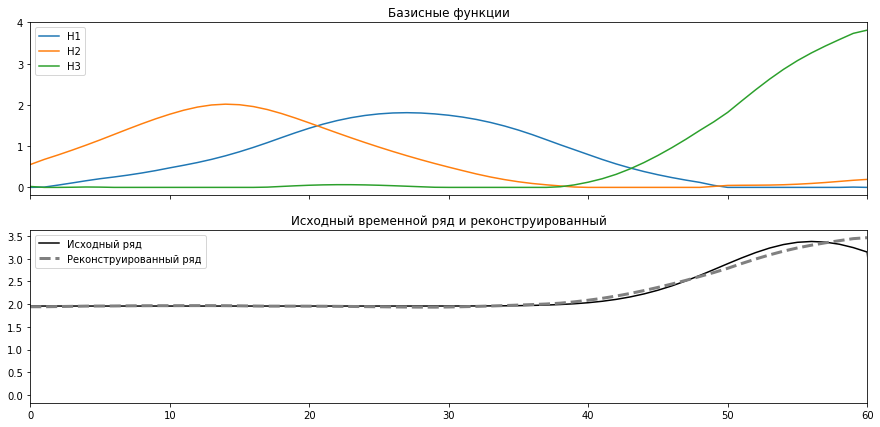

In [ ]:
ind = 0

f, ax = plt.subplots(2, 1, figsize=(15, 7), sharex=True)
ax[0].plot(H[0,:])
ax[0].plot(H[1,:])
ax[0].plot(H[2,:])
# ax[0].plot(H[3,:])
# ax[0].plot(H[4,:])
# ax[0].legend(['H1', 'H2', 'H3', 'H4', 'H5'])
ax[0].legend(['H1', 'H2', 'H3'])
ax[0].set_title("Базисные функции")


print(f'Коэффициенты разложения для {ind}-элемента: {W_train[ind]}')
y = train.iloc[ind].values

ax[1].plot(y, 'k')

reconstr = W_train[ind].dot(H)
ax[1].plot(reconstr, color='gray', linestyle='--', lw=3)
ax[1].set_title('Исходный временной ряд и реконструированный')
ax[1].legend(['Исходный ряд', 'Реконструированный ряд'])
ax[1].set_xlim([0, len(y)-2])
plt.show()

## Особенности применения машинного обучения к временным рядам
**Разбиение на тренировочный и тестовый сет нужно выполнять последовательно**, иначе в алгоритм просочится информация из будущего, на которой он и обучается. 
Train_test_split разбивает данные случайным образом. При работе с временными рядами такой подход не работает, т.к. нарушается временная связь между данными ряда.

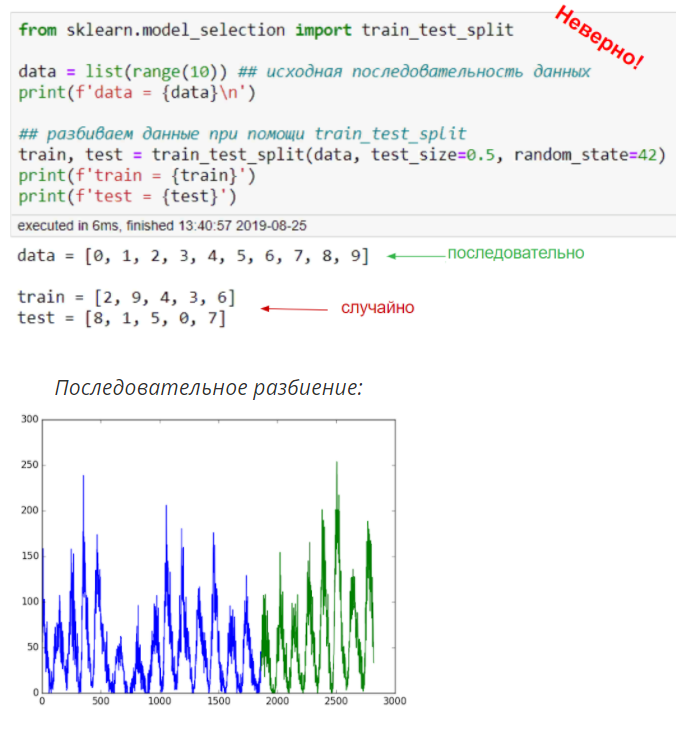

### Аналоги кросс-валидации для временных рядов

Если используем кросс-валидацию — просачивается информация из будущего.

Вместо кросс-валидации используются:

walk forward validation
множественное разбиение

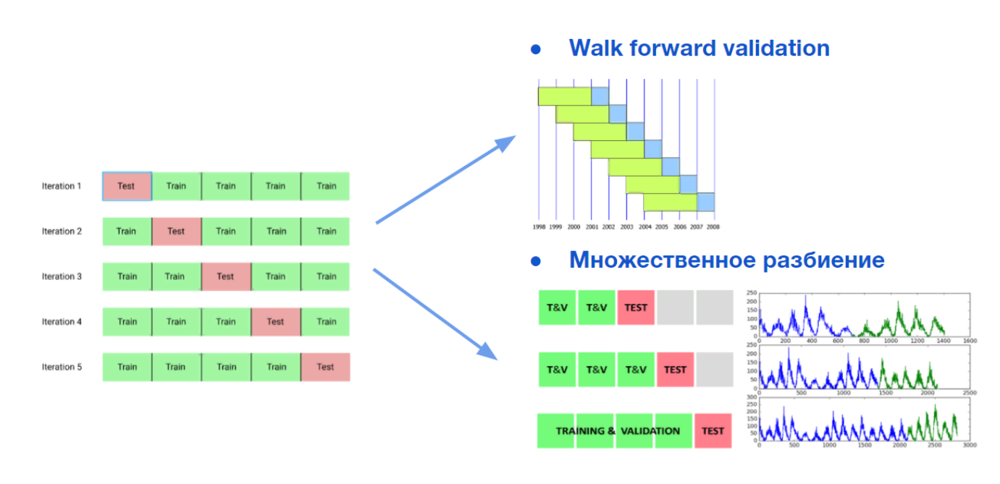

### Исключение

Просачивание информации из будущего возможно, если:

- хотим предсказать ряд или найти в нём аномалию;
- используем ряды для анализа других процессов, каждый ряд является результатом независимого эксперимента.

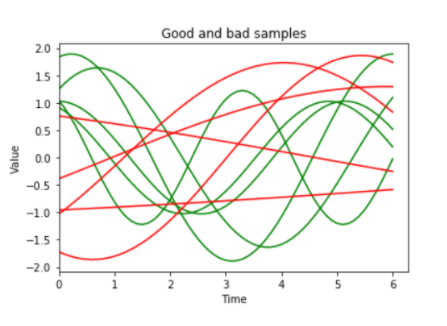

### Задача

1. Сделайте линейное (последовательное) разбиение, используя функцию np.split, в качестве коэффициента разбиения возьмите 0.6 (60% - тренировочный сет, 40% - тестовый). Укажите значение объёма (vol) первой строки тестового сета.

2. Напишите фунцкию множественного разбиения, используя np.array_split и pd.concat. Сделайте разбиение на пять частей, используйте три из них для тренировочного сета. Укажите значение объёма (vol) последней строки тренировочного сета.

3. Напишите функцию walk forward разбиения. Запустите её с параметрами n_splits=10, n_train=3, n_test=1, fold=1, укажите значение последнего элемента unixtime тестового сета.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from math import isnan

In [ ]:


url = 'https://drive.google.com/file/d/1Zddn8j5wTfhdnrsDRxxkFMOpxCqWlx42/view?usp=sharing'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
data = pd.read_csv(path)
data = data.rename(columns = {'ts': 'unixtime'})
data['ts'] = pd.to_datetime(data.unixtime)
data = data[(data.ts >= '2018-02-10') & (data.ts <= '2018-02-22')]

print(f'len(data) = {len(data)}')
data.head()

len(data) = 10792


,unixtime,open,high,low,close,vol,ts
39280,1518220800000000000,1316.7,1317.1,1316.7,1317.0,259,2018-02-10 00:00:00
39281,1518220860000000000,1317.0,1317.0,1316.6,1316.7,103,2018-02-10 00:01:00
39282,1518220920000000000,1316.8,1317.1,1316.7,1317.1,139,2018-02-10 00:02:00
39283,1518220980000000000,1317.0,1317.6,1317.0,1317.5,198,2018-02-10 00:03:00
39284,1518221040000000000,1317.6,1318.3,1317.6,1318.1,218,2018-02-10 00:04:00


In [ ]:
splitCoef = 0.6 # 60 - тренировочный сет, 40 - тестовый сет

## считаем, сколько цен выше, и сколько ниже текущей (насколько сбалансирован дейтасет)
# countPos = len(data[data.label == 1])
# countNeg = len(data[data.label == 0])
# print(f'Pos: {countPos}   Neg: {countNeg}\n')

## линейное разбиение 
features_train, features_test = np.split(data, [int(splitCoef*len(data))])
## разбиение случайным образом
# features_train, features_test = train_test_split(features, test_size=1-splitCoef, random_state=43)

print(f'train start: {features_train.ts.iloc[0]}')
print(f'train end:   {features_train.ts.iloc[-1]}')
print(f'test start:  {features_test.ts.iloc[0]}')
print(f'test end:    {features_test.ts.iloc[-1]}')
print('1:',features_test.vol.iloc[0])
# подготавливаем сеты
# x_train = features_train[featuresList]
# x_test  = features_test[featuresList]
# y_train = features_train.label
# y_test  = features_test.label

train2 = pd.concat([np.array_split(data, 5)[0],np.array_split(data, 5)[1],np.array_split(data, 5)[2]])
test2 = pd.concat([np.array_split(data, 5)[3],np.array_split(data, 5)[3])

print('2:',train2.vol.iloc[-1])

train start: 2018-02-10 00:00:00
train end:   2018-02-16 17:00:00
test start:  2018-02-16 17:01:00
test end:    2018-02-22 00:00:00
1: 934


In [ ]:
def walk forward():

  

2: 934


In [ ]:
n_splits=10
n_train=3
n_test=1
fold=1

In [ ]:
np.array_split(data, n_splits)[9]

,unixtime,open,high,low,close,vol,ts
48993,1519192920000000000,1329.2,1329.3,1328.7,1328.8,315,2018-02-21 06:02:00
48994,1519192980000000000,1328.7,1329.1,1328.7,1328.8,236,2018-02-21 06:03:00
48995,1519193040000000000,1328.7,1328.9,1328.5,1328.8,451,2018-02-21 06:04:00
48996,1519193100000000000,1328.8,1329.0,1328.8,1329.0,106,2018-02-21 06:05:00
48997,1519193160000000000,1329.0,1329.0,1328.4,1328.6,172,2018-02-21 06:06:00
...,...,...,...,...,...,...,...
50067,1519257360000000000,1325.8,1326.3,1325.8,1325.9,258,2018-02-21 23:56:00
50068,1519257420000000000,1325.9,1326.2,1325.9,1326.0,55,2018-02-21 23:57:00
50069,1519257480000000000,1325.9,1326.0,1325.6,1325.9,120,2018-02-21 23:58:00
50070,1519257540000000000,1325.8,1326.4,1325.7,1326.2,129,2018-02-21 23:59:00


In [ ]:
np.array_split(data, n_splits)[3]

,unixtime,open,high,low,close,vol,ts
42519,1518598920000000000,1337.3,1337.3,1336.9,1337.0,70,2018-02-14 09:02:00
42520,1518598980000000000,1337.0,1337.1,1337.0,1337.0,23,2018-02-14 09:03:00
42521,1518599040000000000,1337.0,1337.1,1337.0,1337.1,30,2018-02-14 09:04:00
42522,1518599100000000000,1337.1,1337.2,1336.9,1336.9,29,2018-02-14 09:05:00
42523,1518599160000000000,1336.9,1337.0,1336.8,1337.0,57,2018-02-14 09:06:00
...,...,...,...,...,...,...,...
43593,1518666960000000000,1353.6,1353.8,1353.4,1353.6,239,2018-02-15 03:56:00
43594,1518667020000000000,1353.6,1353.8,1353.5,1353.8,54,2018-02-15 03:57:00
43595,1518667080000000000,1353.7,1353.8,1353.6,1353.8,44,2018-02-15 03:58:00
43596,1518667140000000000,1353.8,1354.3,1353.8,1354.2,81,2018-02-15 03:59:00
